This notebook creates a topic model based on the She

## Import libraries

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import hypertools as hyp
import numpy as np
from scipy.spatial.distance import cdist
from scipy.signal import resample
from scipy import ndimage
from scipy.stats import zscore
from skimage.transform import resize
from fastdtw import fastdtw
from scipy.spatial.distance import correlation

sns.set_context('poster')
%matplotlib inline
plt.rc('figure', figsize=(12, 8))

def _z2r(z):
    """
    Function that calculates the inverse Fisher z-transformation

    Parameters
    ----------
    z : int or ndarray
        Fishers z transformed correlation value

    Returns
    ----------
    result : int or ndarray
        Correlation value

    """
    with np.errstate(invalid='ignore', divide='ignore'):
        return (np.exp(2 * z) - 1) / (np.exp(2 * z) + 1)


def _r2z(r):
    """
    Function that calculates the Fisher z-transformation

    Parameters
    ----------
    r : int or ndarray
        Correlation value

    Returns
    ----------
    result : int or ndarray
        Fishers z transformed correlation value

    """
    with np.errstate(invalid='ignore', divide='ignore'):
        return 0.5 * (np.log(1 + r) - np.log(1 - r))


## Load data and forward fill the segment labels

In [2]:
movie_text = pd.read_excel('../data/Sherlock_Segments_1000_NN_2017.xlsx', )
movie_text['Scene Segments'].fillna(method='ffill', inplace=True)

## Fit topic model to manually-annotated movie

In [3]:
# create a list of text samples from the scene descriptions / details to train the topic model
movie = movie_text.loc[:,'Scene Details - A Level ':'Words on Screen '].apply(lambda x: ', '.join(x.fillna('')), axis=1).values.tolist()

# create a list of overlapping text samples
movie50 = []
wsize=50
for idx, sentence in enumerate(movie):
    movie50.append(','.join(movie[idx:idx+wsize]))

# vectorizer parameters
vectorizer = {
    'model' : 'CountVectorizer', 
    'params' : {
        'stop_words' : 'english'
    }
}

# topic model parameters
semantic = {
    'model' : 'LatentDirichletAllocation', 
    'params' : {
        'n_components' : 100,
        'learning_method' : 'batch',
        'random_state' : 0,
    }
}

# create movie model with hypertools
movie_model = hyp.tools.format_data(movie50, vectorizer=vectorizer, semantic=semantic, corpus=movie50)[0]

# description are by scene, not TR so stretch the model to be in TRs
ranges =[[d['Start Time (TRs, 1.5s)'],d['End Time (TRs, 1.5s)']] for i, d in movie_text.iterrows()] 
expanded = []
for i in range(1976):
    try:
        idx = np.where([i>=r[0] and i<=r[1] for r in ranges])[0][0]
        expanded.append(movie_model[idx, :])
    except:
        expanded.append(movie_model[0, :])
movie_model = np.array(expanded)

KeyboardInterrupt: 

## Plot the movie model

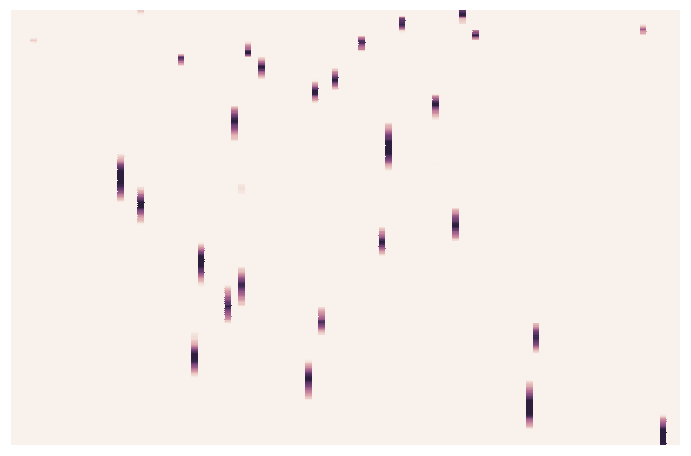

In [4]:
ax = sns.heatmap(pd.DataFrame(movie_model), yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
plt.show()
# ax.figure.savefig('../figures/movie_model_unwarped.png')
# np.save('../data/movie_topics', movie_topics)

## Movie timepoint-by-timepoint corr matrix

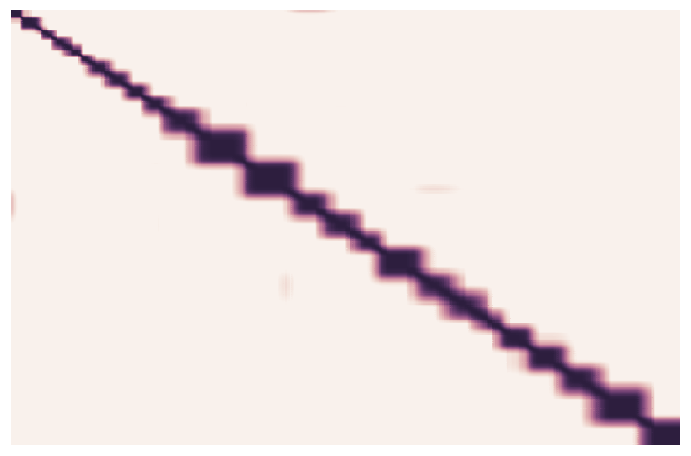

In [5]:
# ax = sns.heatmap(pd.DataFrame(movie_model).T.corr(),yticklabels=250, xticklabels=250, cmap=sns.color_palette('viridis', 100))
ax = sns.heatmap(pd.DataFrame(movie_model).T.corr(), vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
# np.save('../data/movie_corrmat', pd.DataFrame(movie_model).T.corr().as_matrix())

## Transform recalls

In [6]:
# loop over subjects
recall5 = []
wsize=10
for sub in range(1, 18):
    
    # load subject data
    recall = pd.read_csv('../data/NN'+str(sub)+' transcript.txt', header=None, sep='.', error_bad_lines=False, encoding='latin-1').values.tolist()[0][:-1]
    
    rs = []  
    # loop over sentences
    for sentence in recall:
        try:
            s = sentence.encode('utf-8').strip()
            rs.append(sentence)
        except:
            pass # skips over nans
    
    # create overlapping windows of n sentences
    sub_recall5 = []
    for idx, sentence in enumerate(rs):
        sub_recall5.append(','.join(rs[idx:idx+wsize]))
        
    recall5.append(sub_recall5)
    
# create recall models
recall_models = hyp.tools.format_data(recall5, vectorizer=vectorizer, semantic=semantic, corpus=movie50)
    
recall_models_rs = list(map(lambda x: resample(x, 1976), recall_models))

In [5]:
import wikipedia as wiki

In [20]:
wiki_text = wiki.page('A_Study_in_Pink').content.split('==')[2].split('.')
wsize=5
wiki_recall5 = []
for idx, sentence in enumerate(wiki_text):
    wiki_recall5.append(','.join(wiki_text[idx:idx+wsize]))
wiki_model = hyp.tools.format_data(wiki_recall5, vectorizer=vectorizer, semantic=semantic, corpus=movie50)

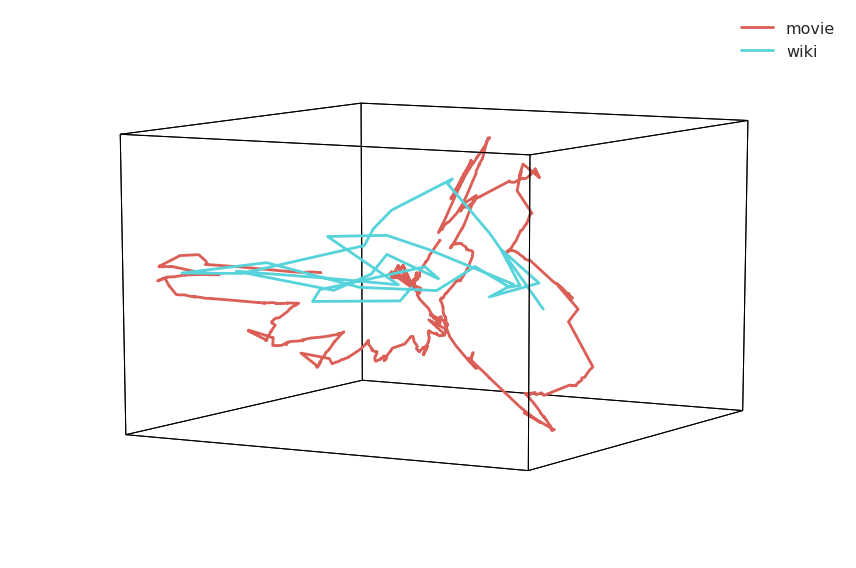

In [33]:
hyp.plot([movie_model, wiki_model[0]], reduce='SpectralEmbedding', ndims=3, legend=['movie', 'wiki'])

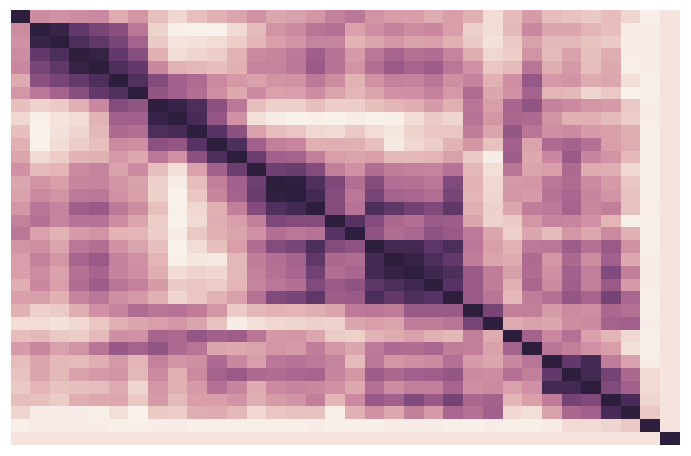

In [25]:
ax = sns.heatmap(pd.DataFrame(wiki_model[0]).T.corr(), yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
plt.show()

In [7]:
np.save('../data/video_text', movie50)
np.save('../data/recall_text', recall5)

## Save video and recall models

In [9]:
np.save('../data/models_t100_v50_r10', [movie_model, recall_models])
np.save('../data/models_t100_v50_r10_resampled', [movie_model, recall_models_rs])

## Plot the average recall model

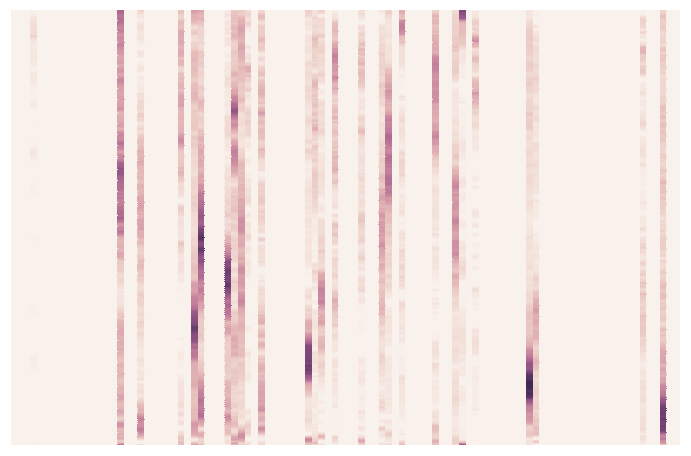

In [21]:
ax = sns.heatmap(pd.DataFrame(np.mean(recall_models_rs, 0)), vmin=0, vmax=.25, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(100, light=.95), cbar=False)
# ax.figure.savefig('../figures/avg_recall_model_unwarped.png')
# np.save('../data/movie_topics', movie_topics)

## Plot recall model

0


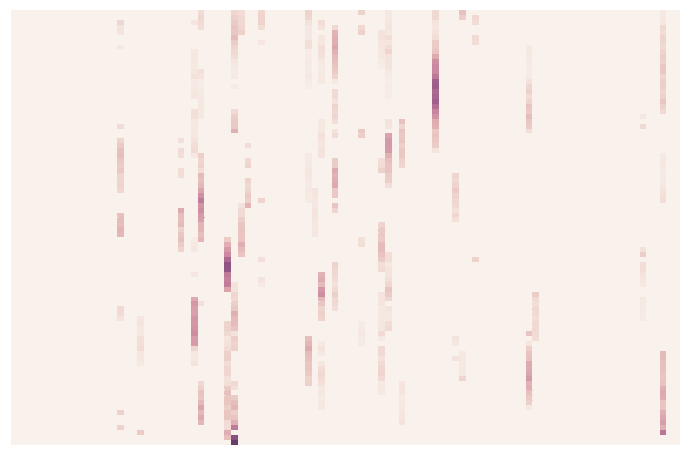

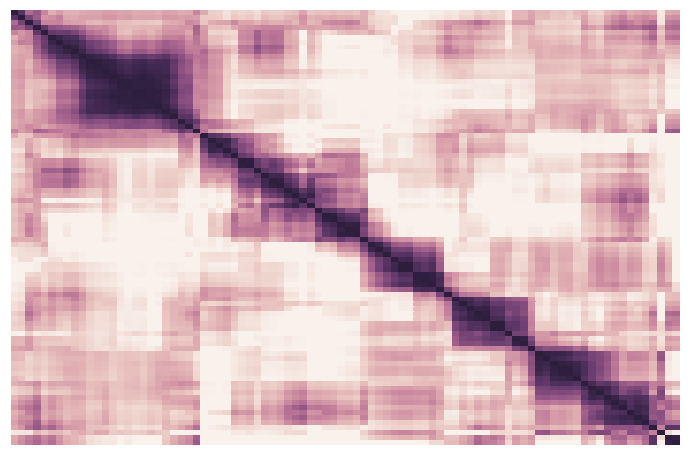

1


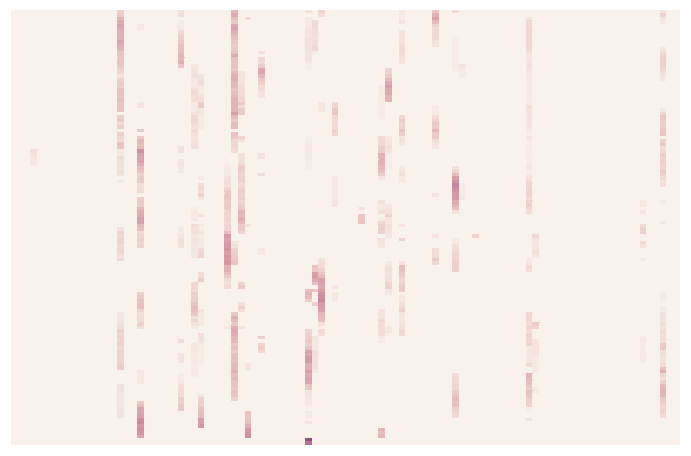

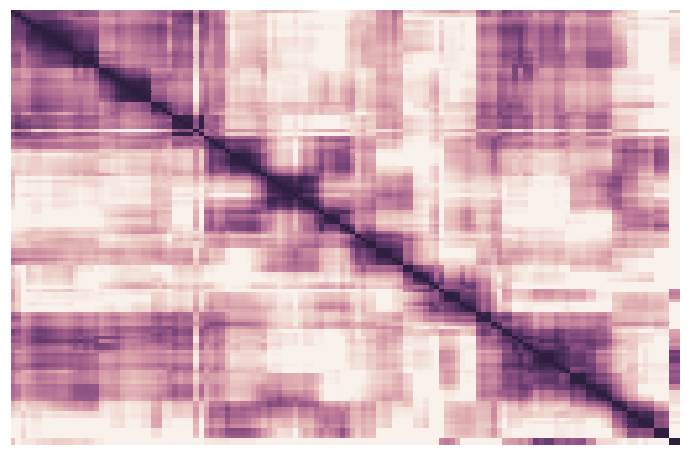

2


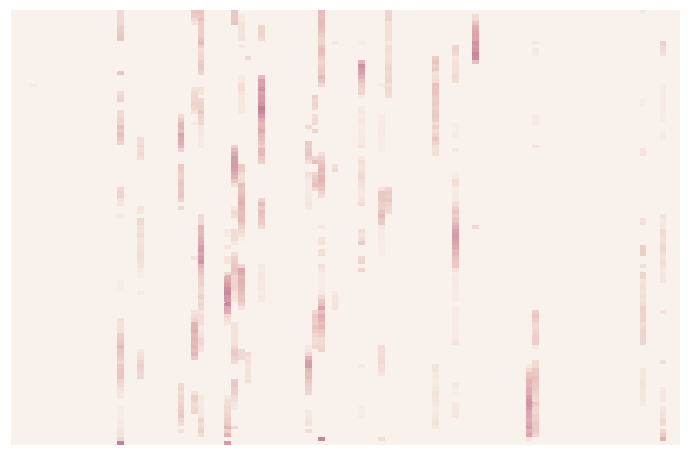

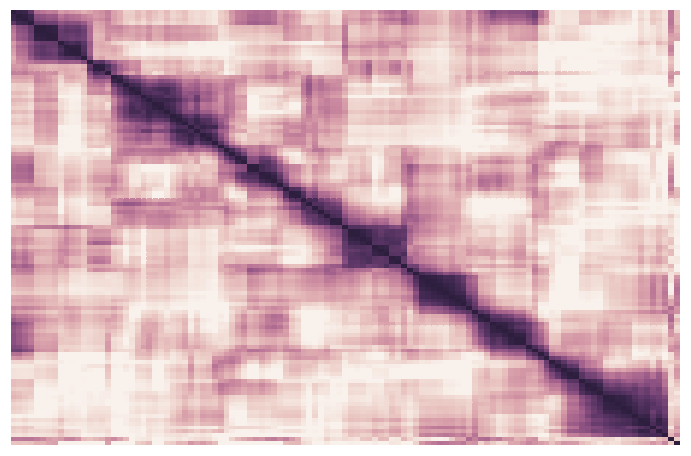

3


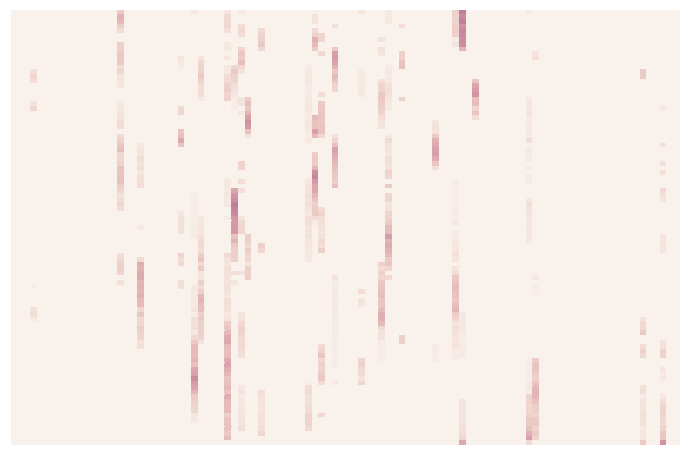

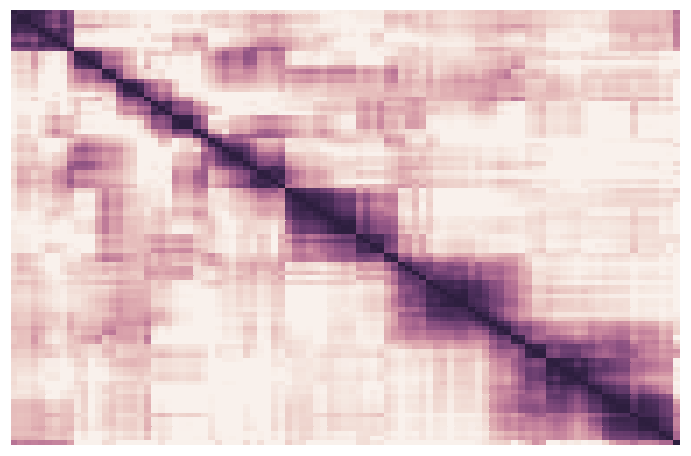

4


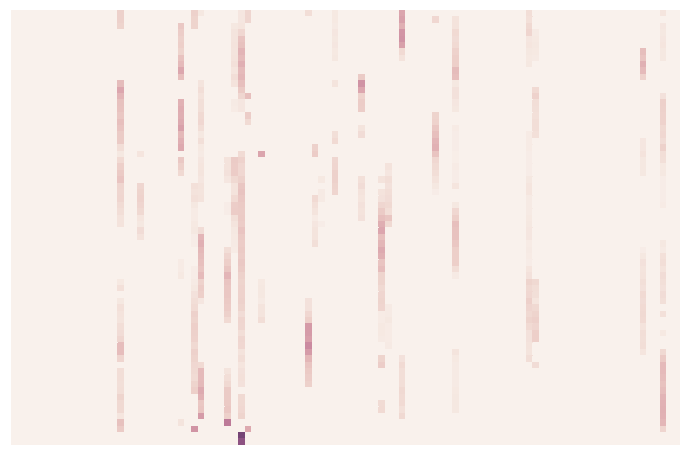

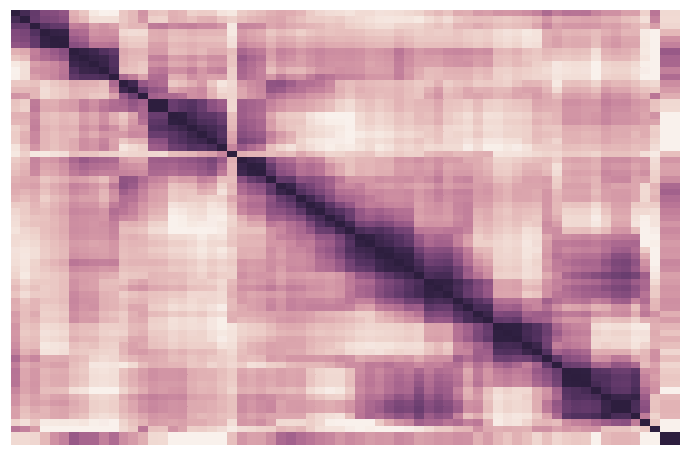

5


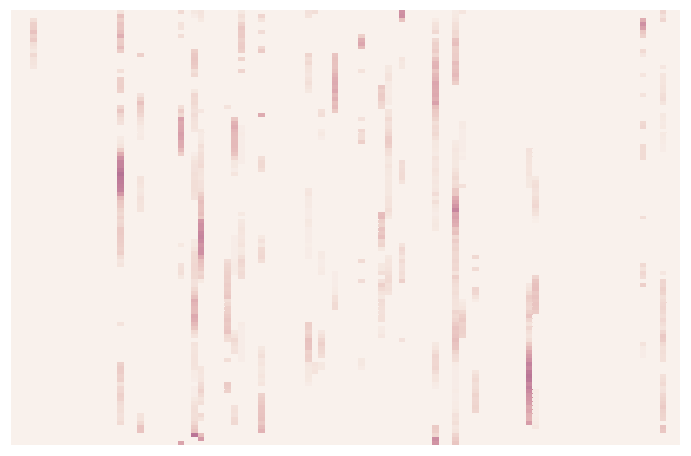

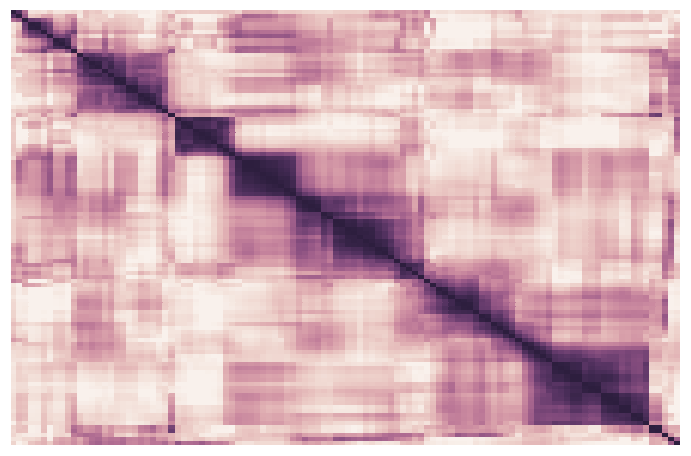

6


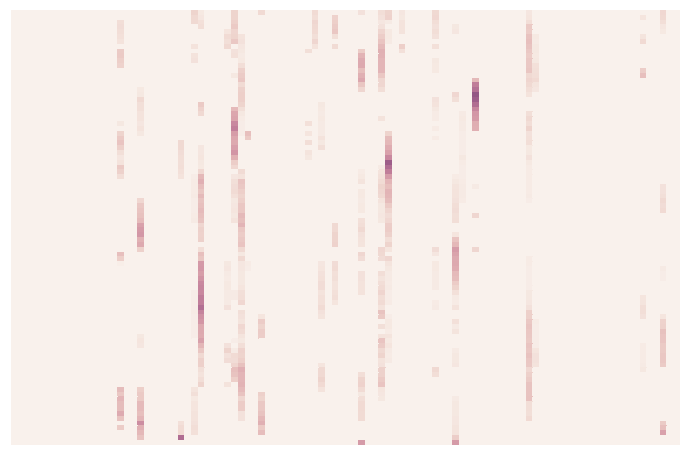

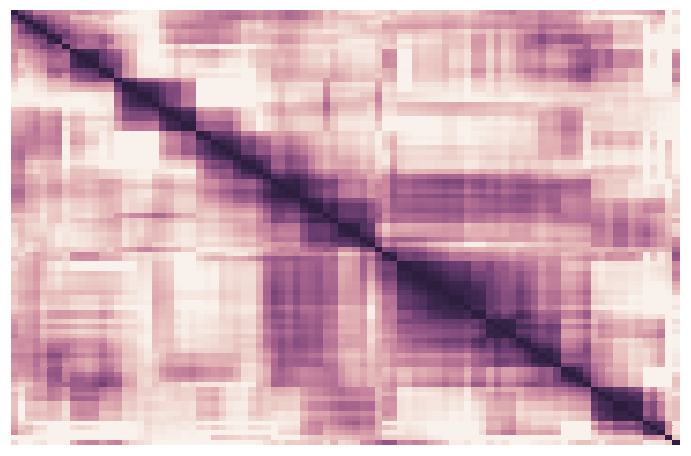

7


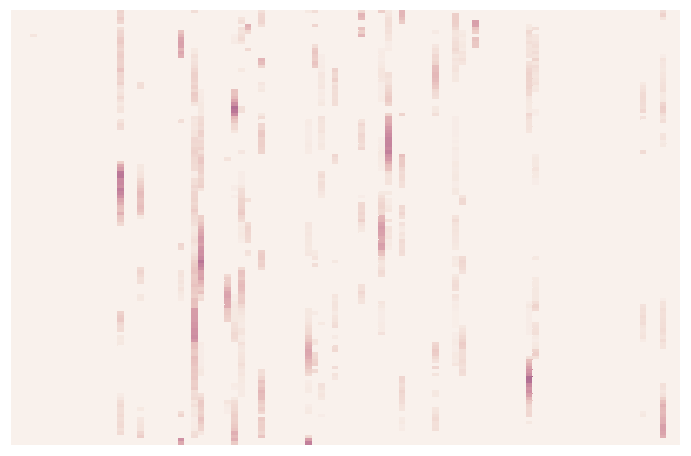

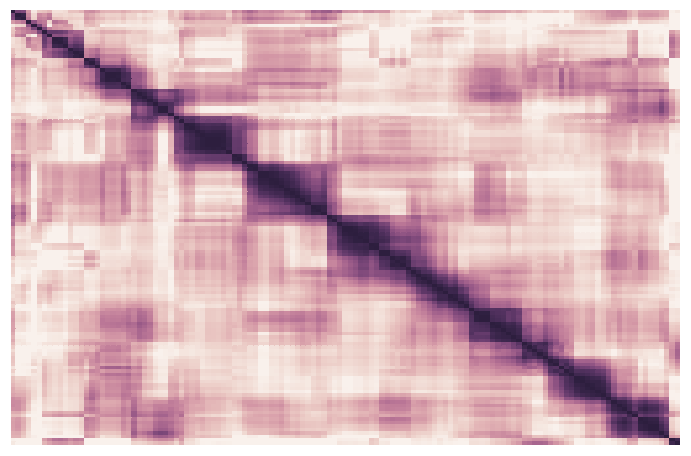

8


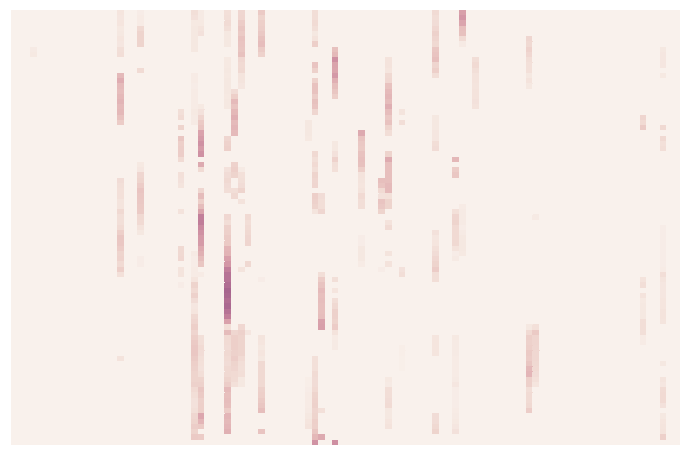

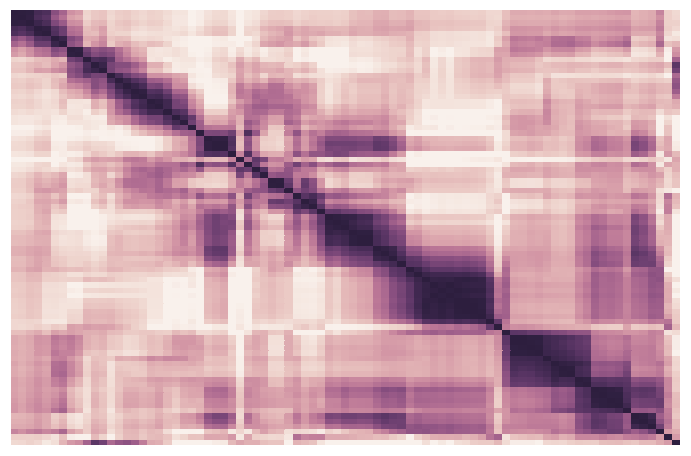

9


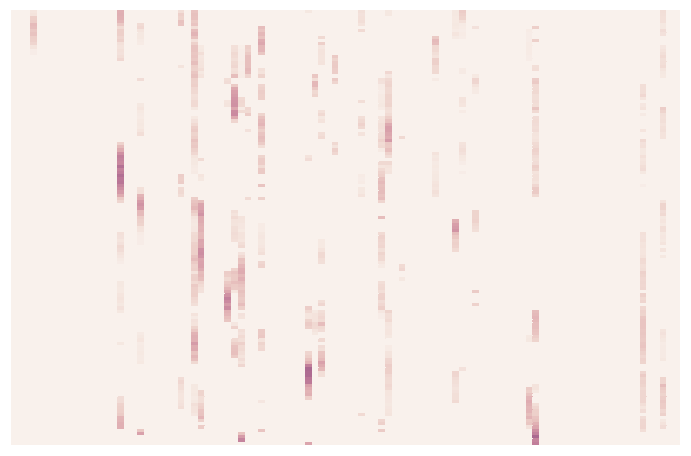

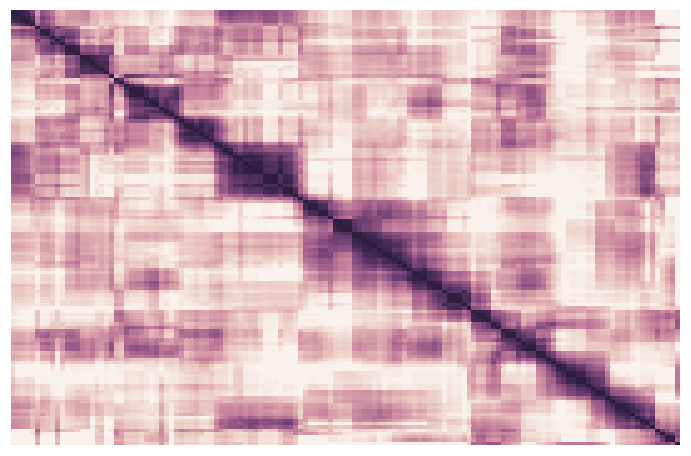

10


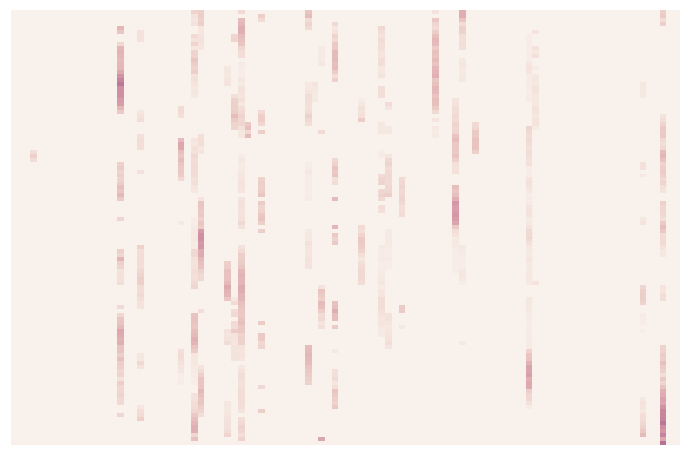

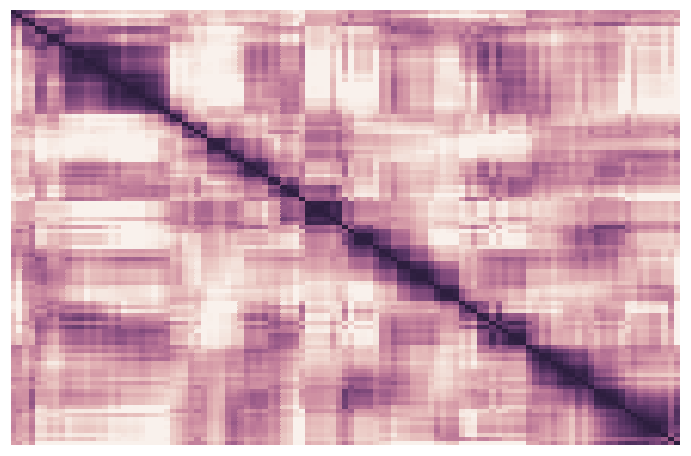

11


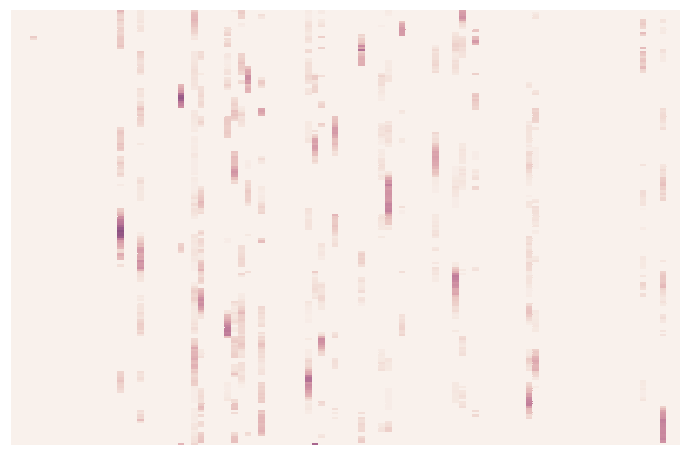

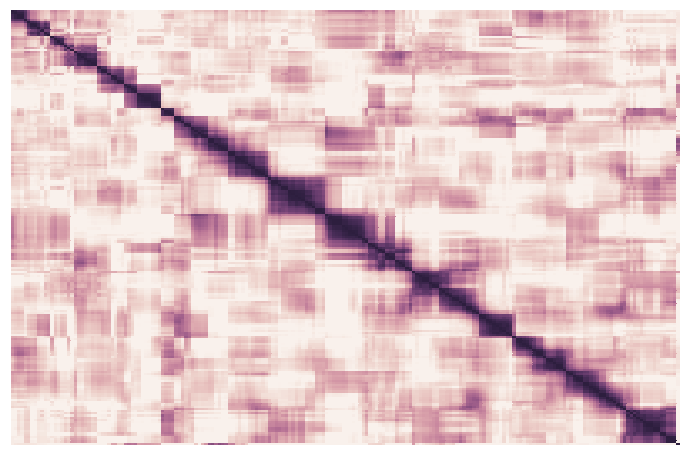

12


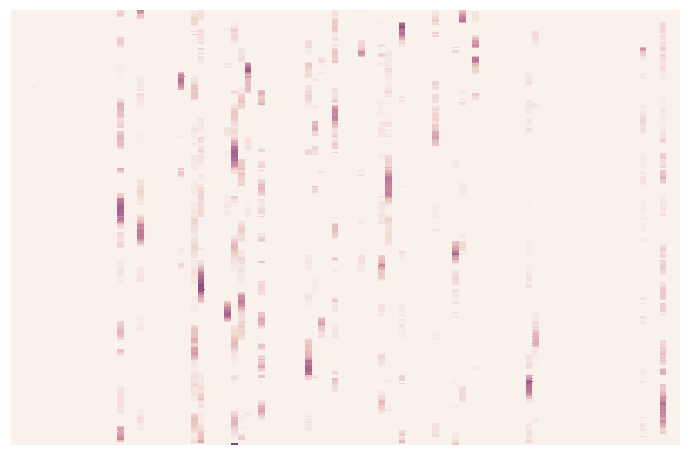

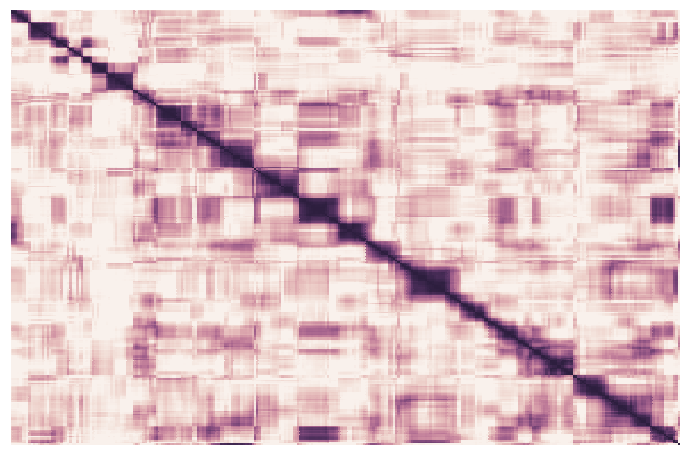

13


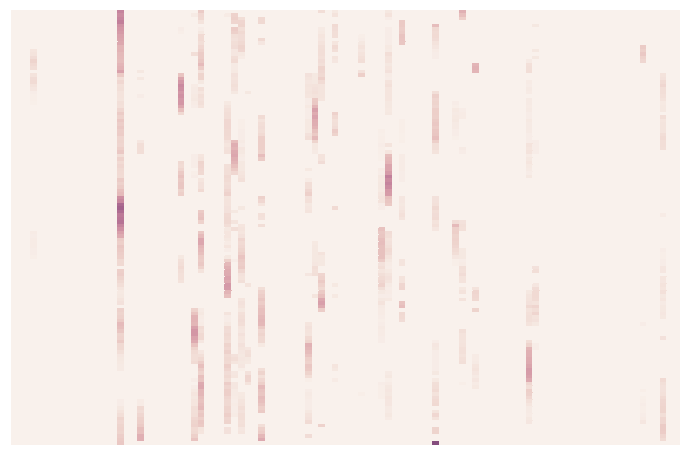

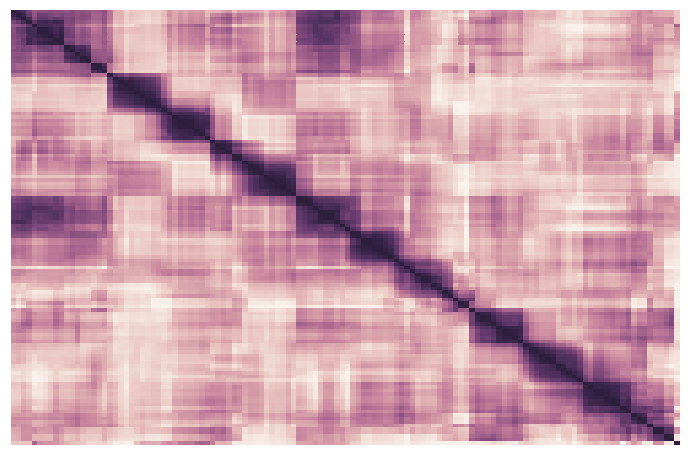

14


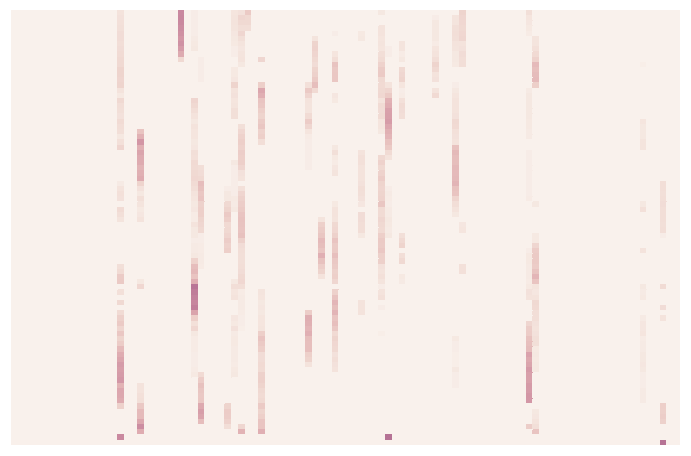

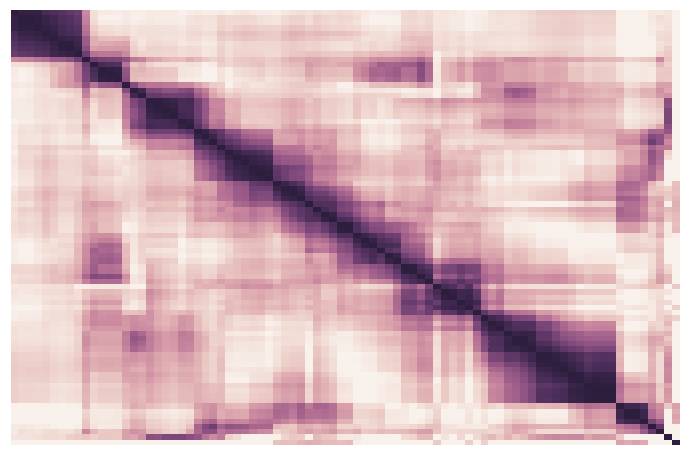

15


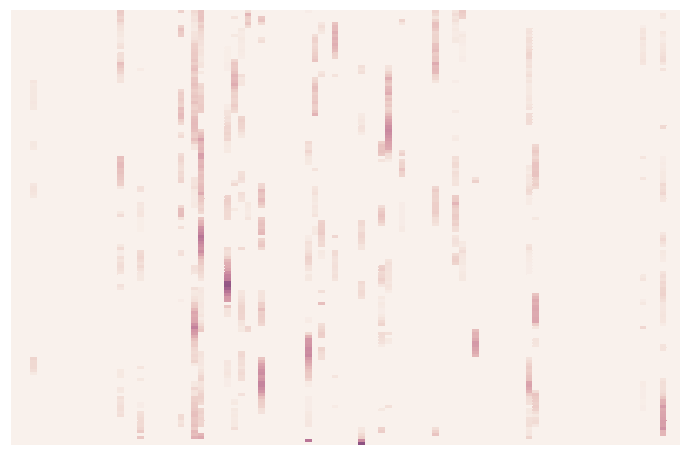

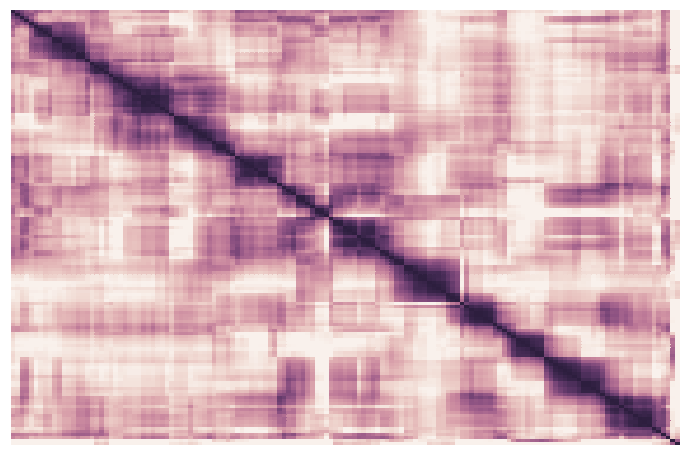

16


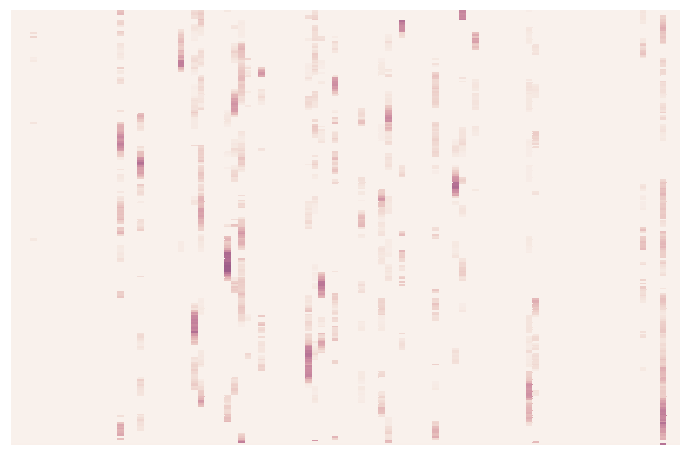

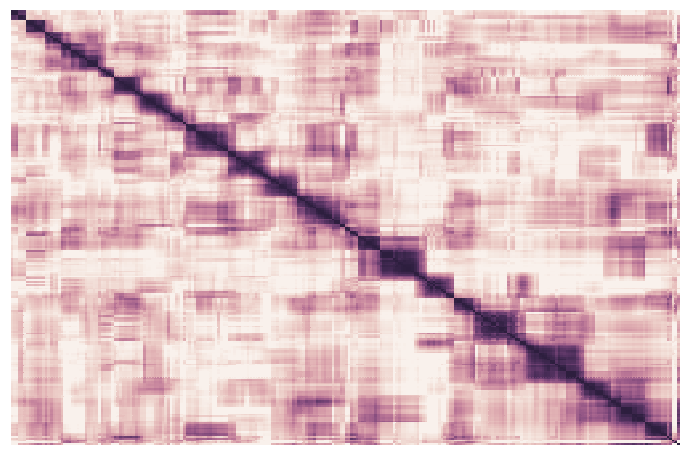

In [28]:
for i, model in enumerate(recall_models):
    print(i)
    sns.heatmap(model, vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
    plt.show()
    sns.heatmap(pd.DataFrame(model).T.corr(), vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
    plt.show()

In [8]:
for i in range(17):
#     sns.heatmap(pd.DataFrame(recall_models_rs[i]).T.corr(), vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
    d = pd.DataFrame(recall_models_rs[i]).T.corr().values
    np.save('../data/s%s_recall_corrmat.npy' % str(i+1), d)
#     plt.show()

## Plot movie-recall correlation

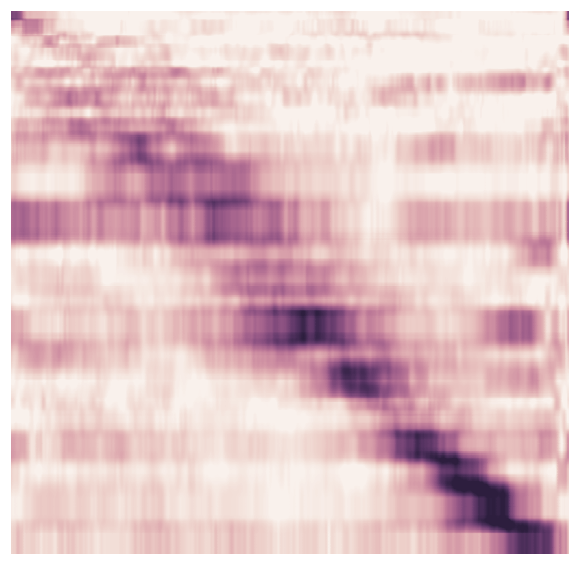

In [10]:
plt.rc('figure', figsize=(10, 10))
cms = [1 - cdist(movie_model, r, metric='correlation') for r in recall_models_rs]
ax = sns.heatmap(np.mean(cms, axis=0), vmin=0, vmax=.5, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
ax.figure.savefig('../figures/movie_recall_corrmat.png')

## Permutation-corrected movie recall correlation plot

In [ ]:
nperms = 1000
perms = []
for perm in range(nperms):
    s = np.random.randint(1, 1975, 1)[0]
    perms.append(np.mean([1 - cdist(movie_model, np.roll(r, shift=s, axis=0), metric='correlation') for r in recall_models_rs], 0))

In [ ]:
sorted_perms = np.sort(np.array(perms), 0)

In [ ]:
real = np.mean([1 - cdist(movie_model, r, metric='correlation') for r in recall_models_rs], 0)

In [ ]:
real[np.sum(real>sorted_perms, 0)<=950]=np.nan
sns.heatmap(real, vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)

## Use dynamic time warping to correct for movie-time recall-time non-linearities

In [53]:
cms_aligned = []
movie_models_dtw = []
recall_models_rs_dtw = []
paths = []
for i, r in enumerate(recall_models_rs):
    distance, path = fastdtw(movie_model, r, dist=correlation)
    paths.append(path)
    m = movie_model[list(map(lambda x: x[0], path)), :]
    r = r[list(map(lambda x: x[1], path)), :]
    movie_models_dtw.append(m)
    recall_models_rs_dtw.append(r)
    np.save('/Users/andyheusser/Documents/cdl/projects/sherlock/data/s%s_recall_model_dtw' % str(i+1), r)
#     c = 1 - cdist(resample(m, 1976), resample(r, 1976), 'correlation')
#     c = 1 - cdist(resample(m, 1976), resample(r, 1976), 'correlation')
#     cms_aligned.append(c)
# np.save('../data/movie_topics_dtws', movie_topics_dtws)
# np.save('../data/recall_topics_dtws', recall_topics_dtws)

In [19]:
for i in range(17):
    path = paths[i]
    np.save('../data/s%s_dtw_path.npy' % str(i+1), path)

0


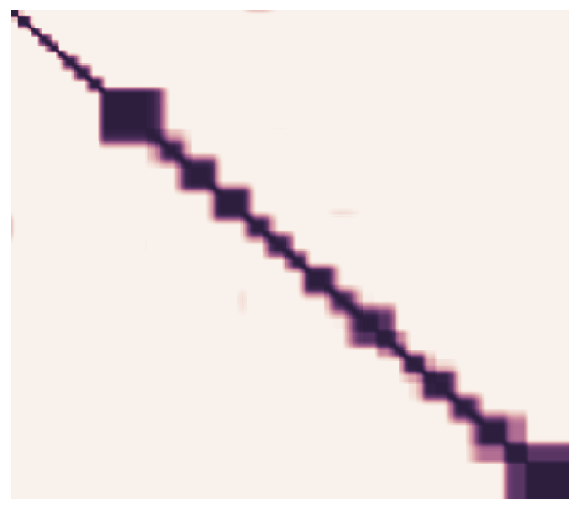

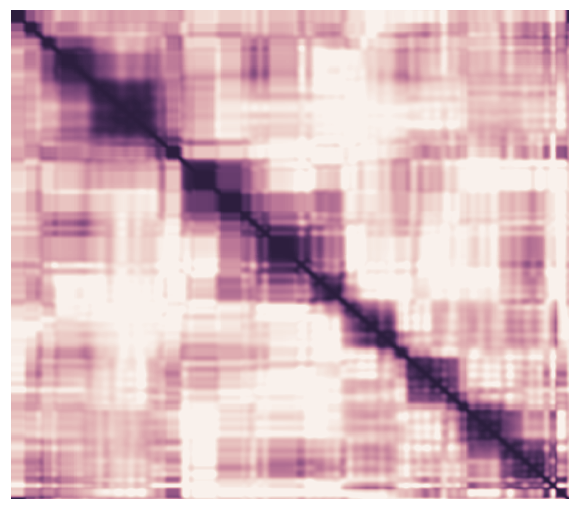

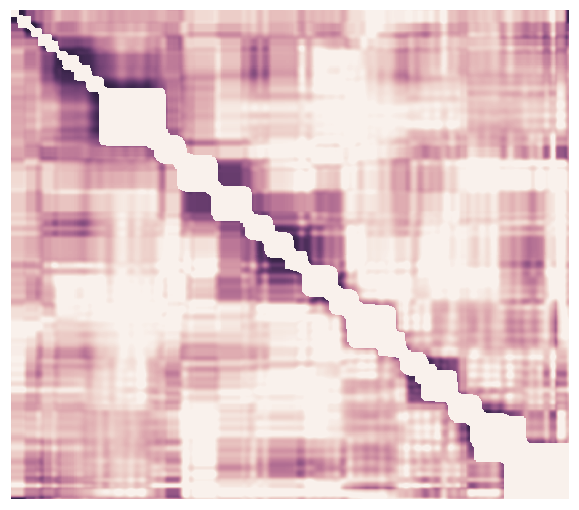

1


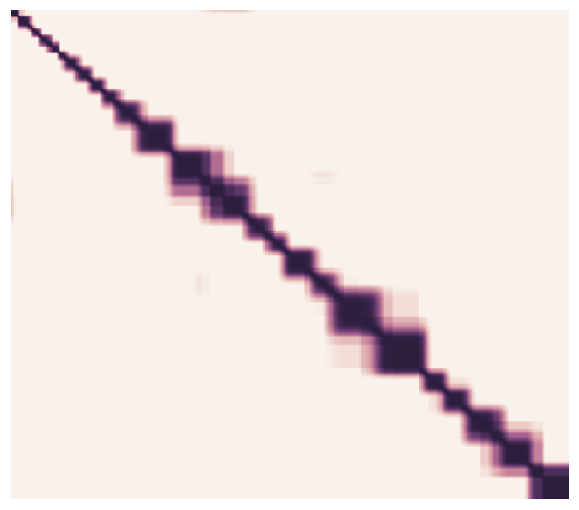

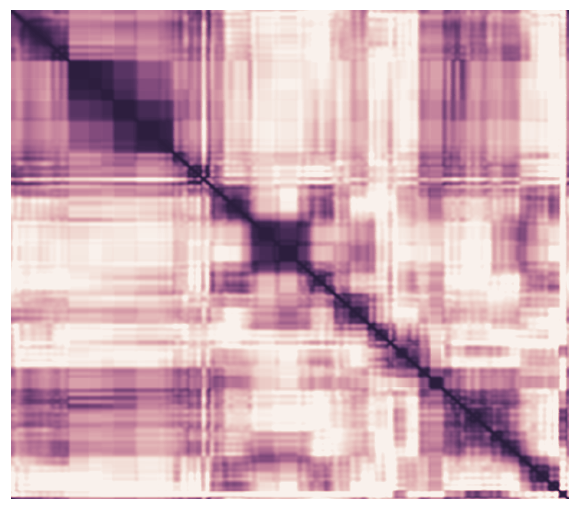

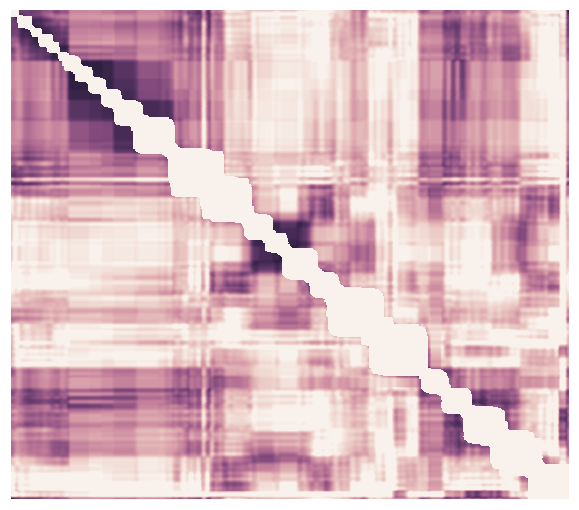

2


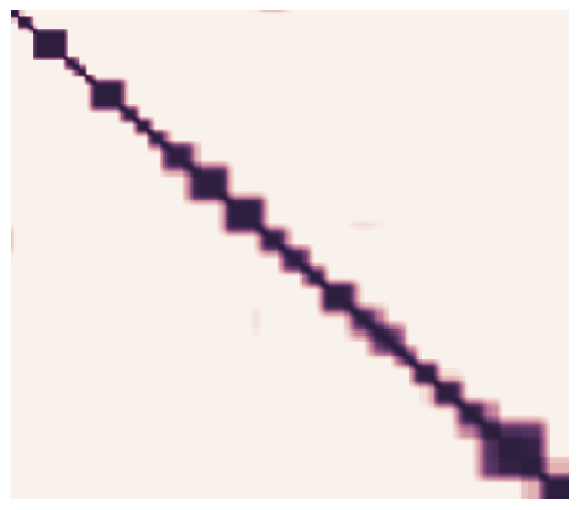

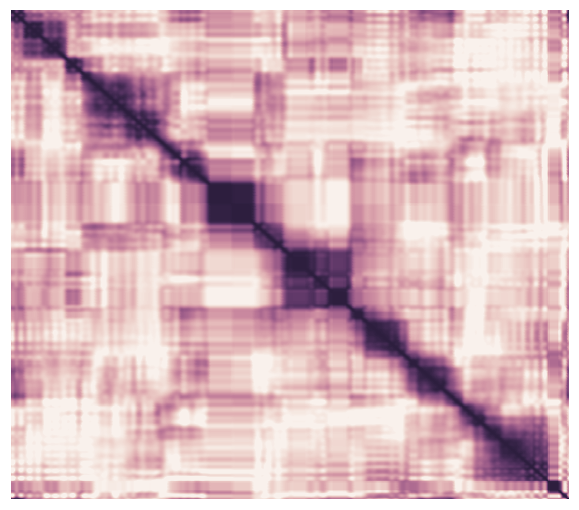

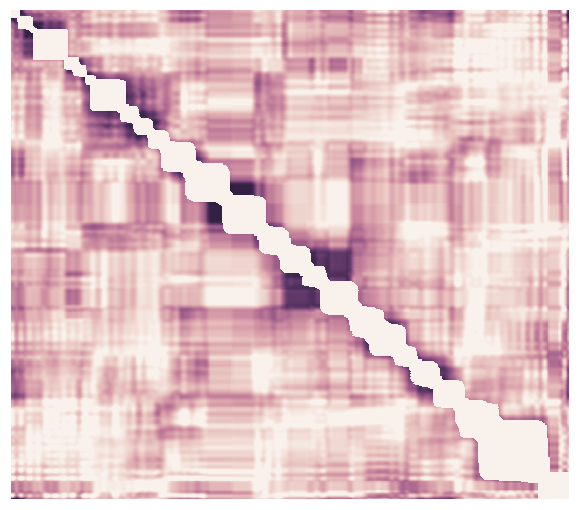

3


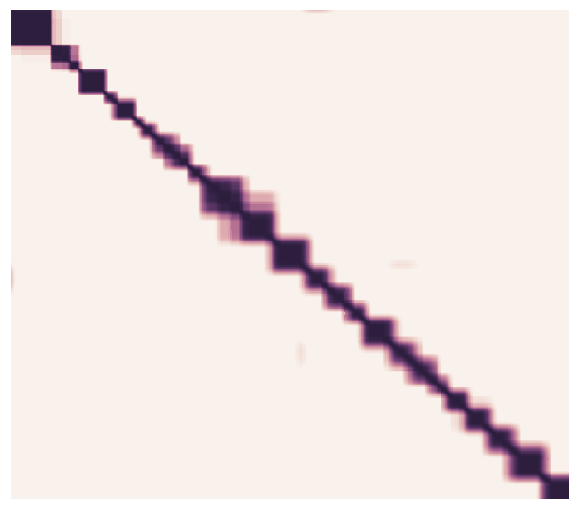

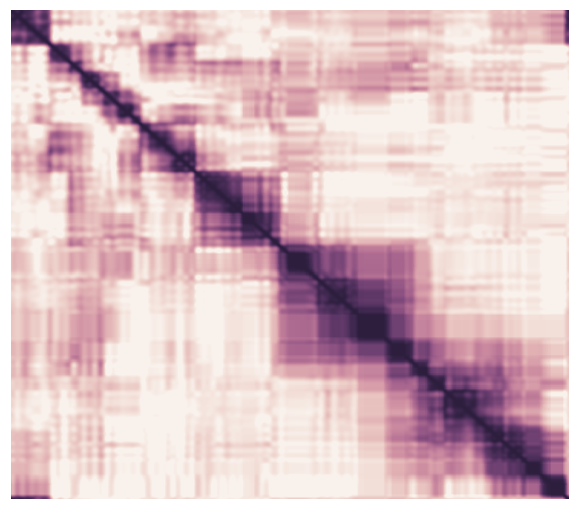

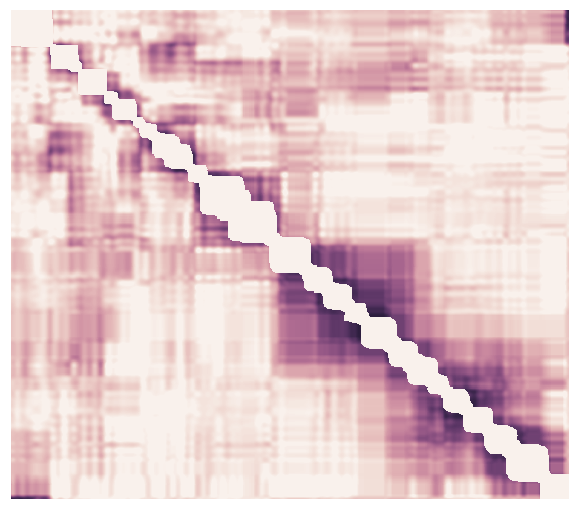

4


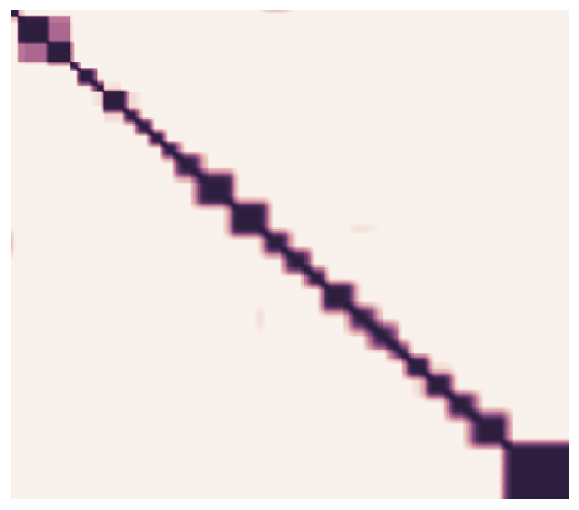

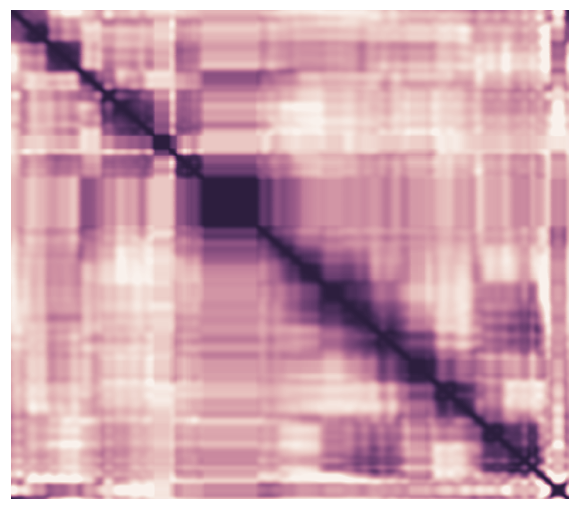

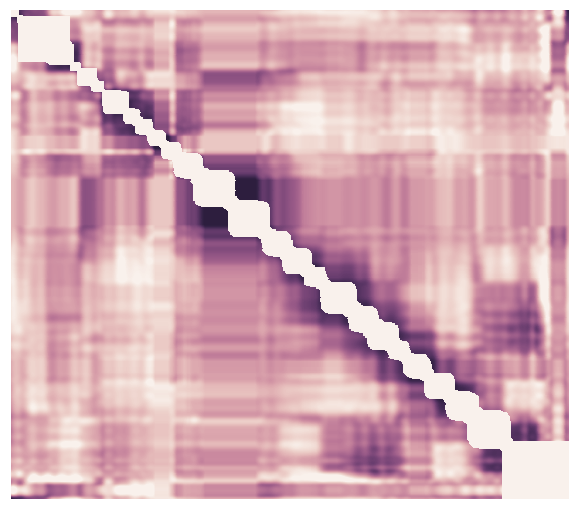

5


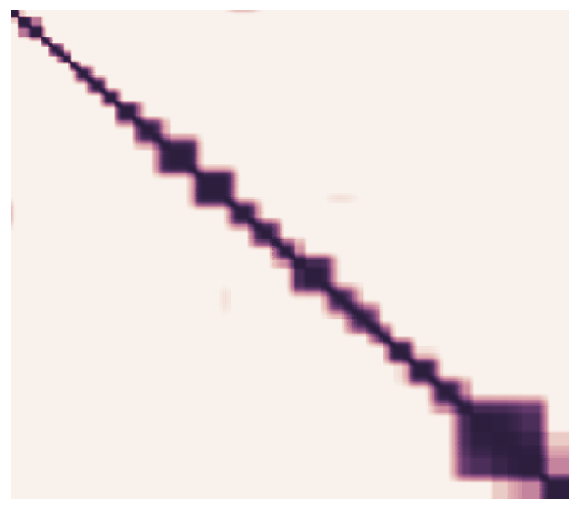

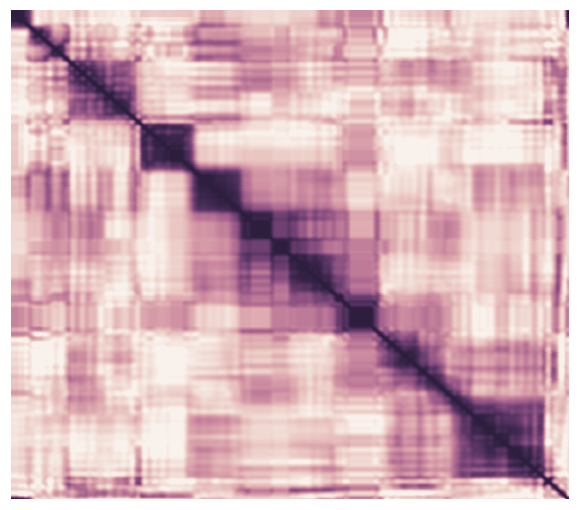

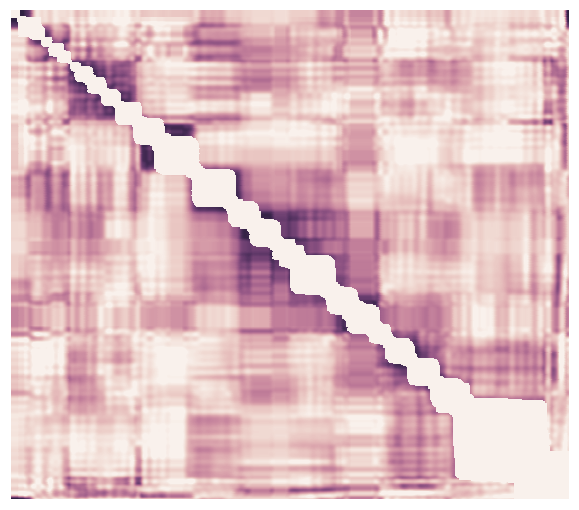

6


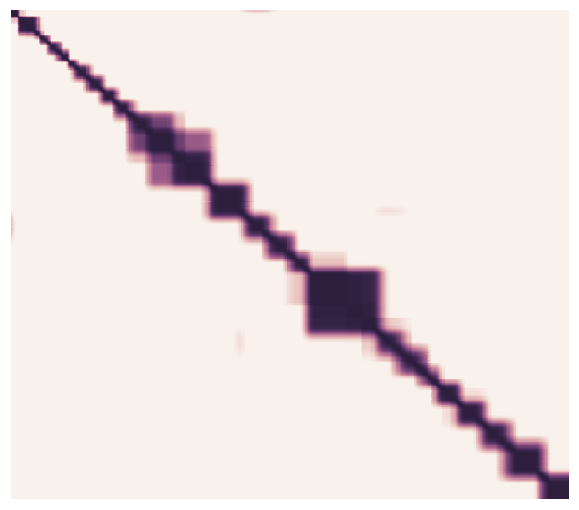

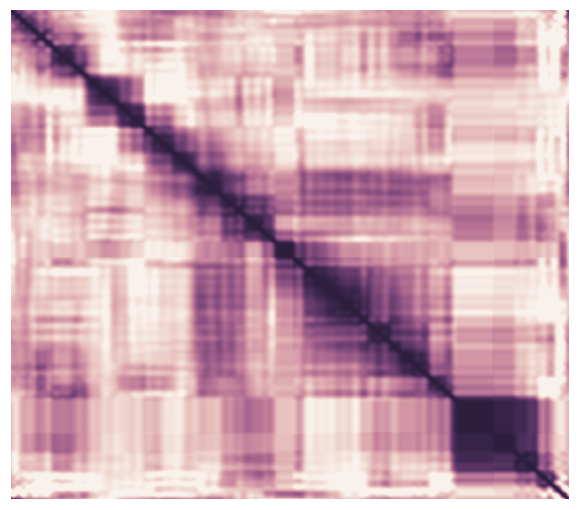

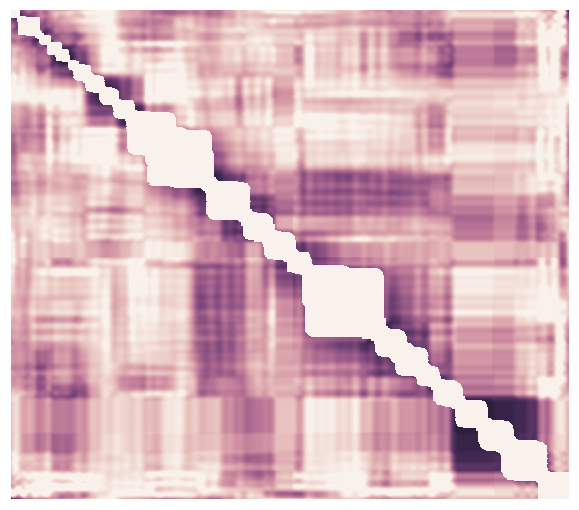

7


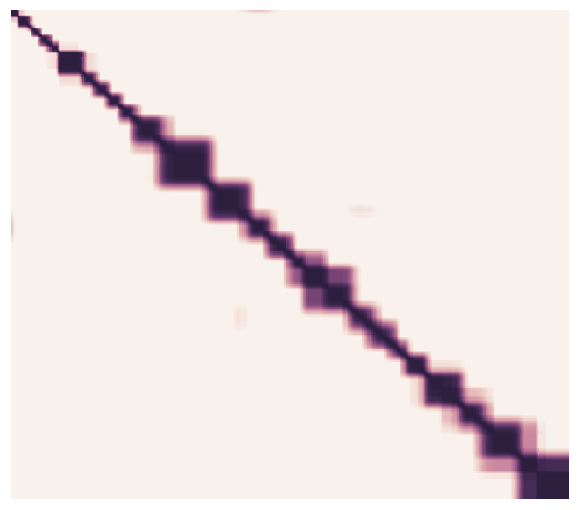

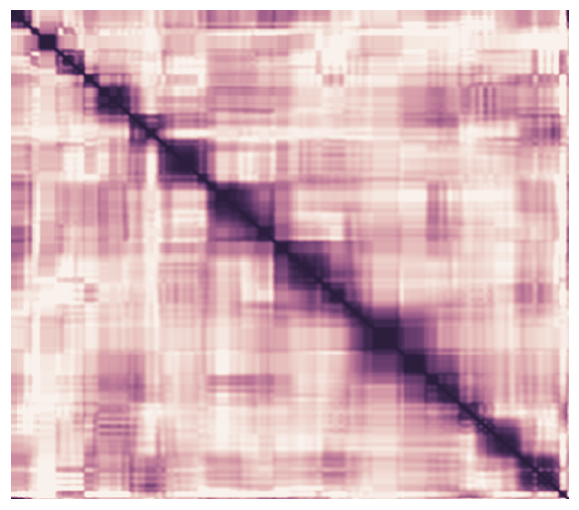

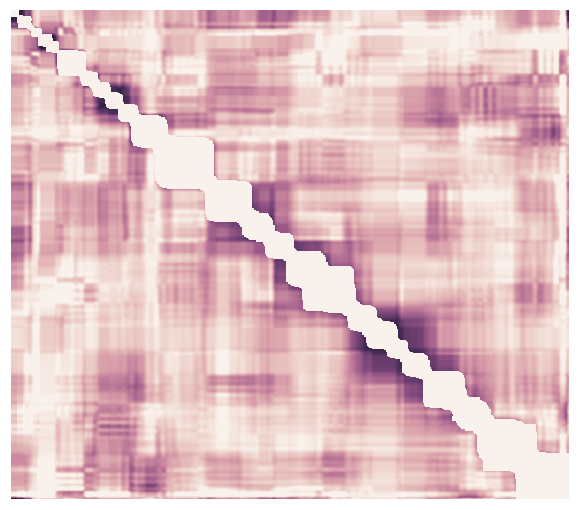

8


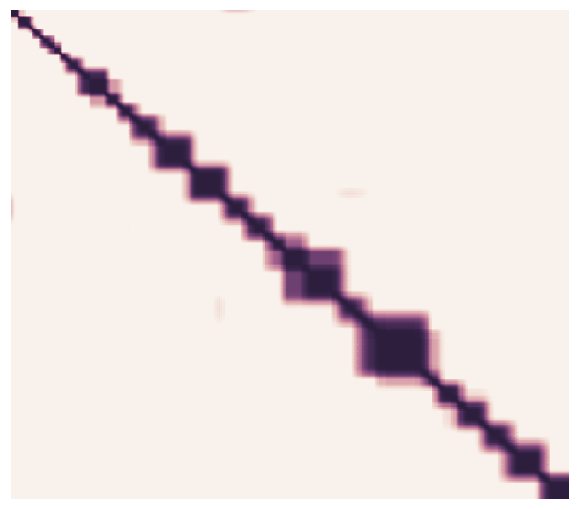

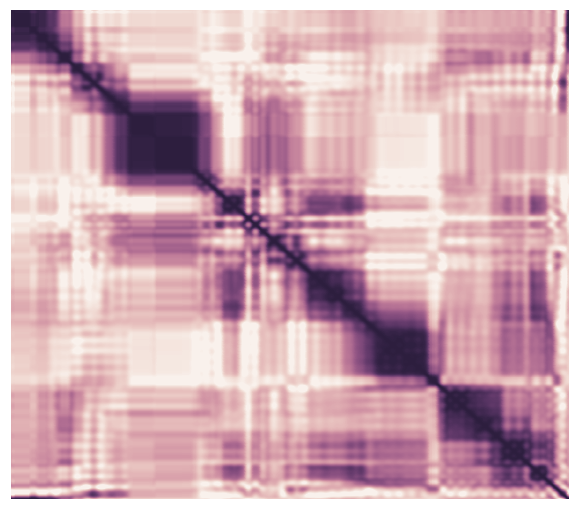

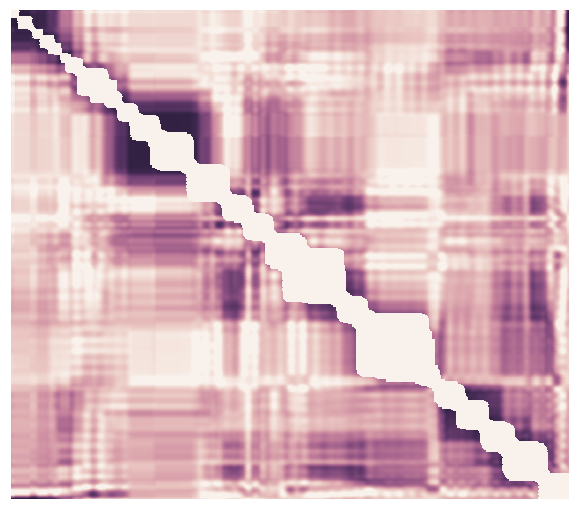

9


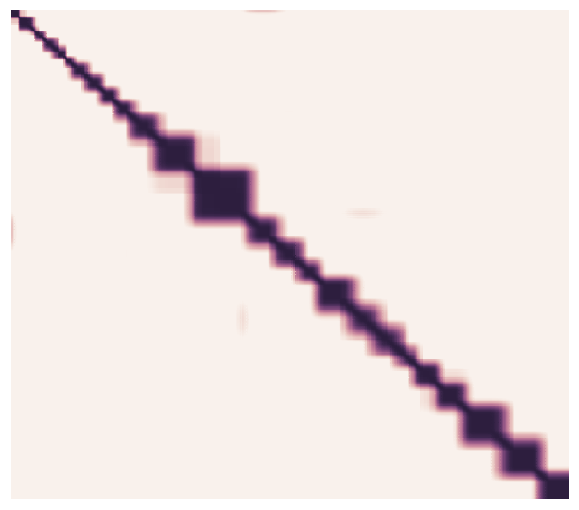

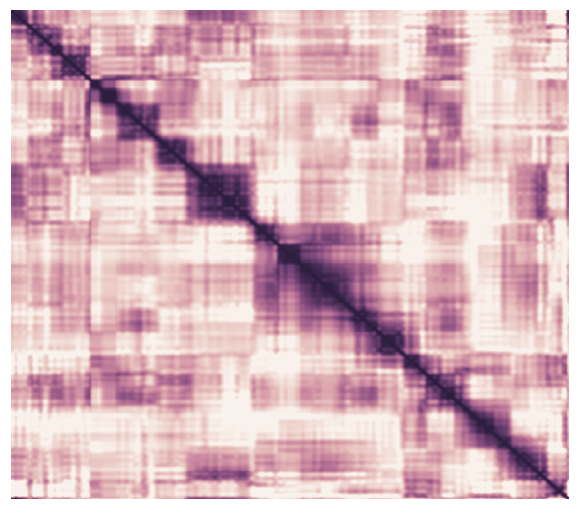

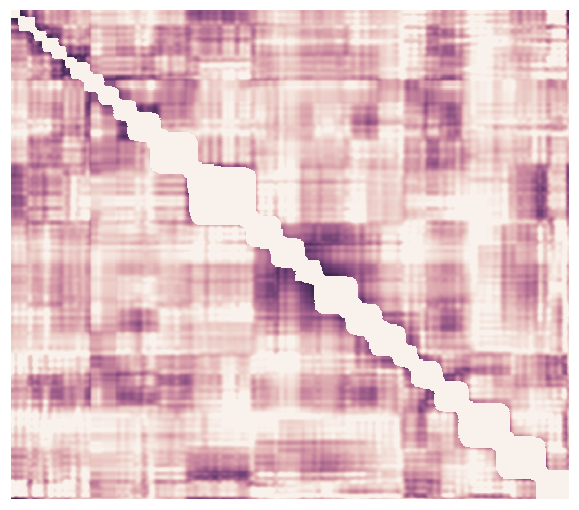

10


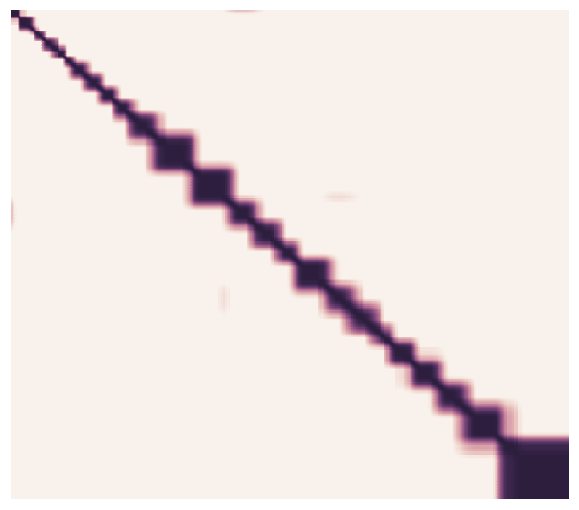

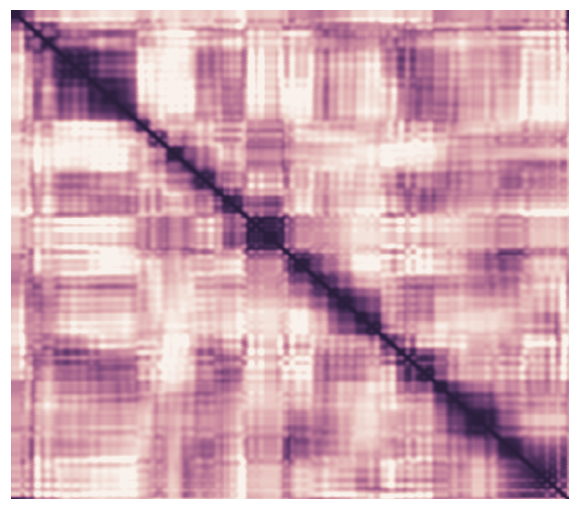

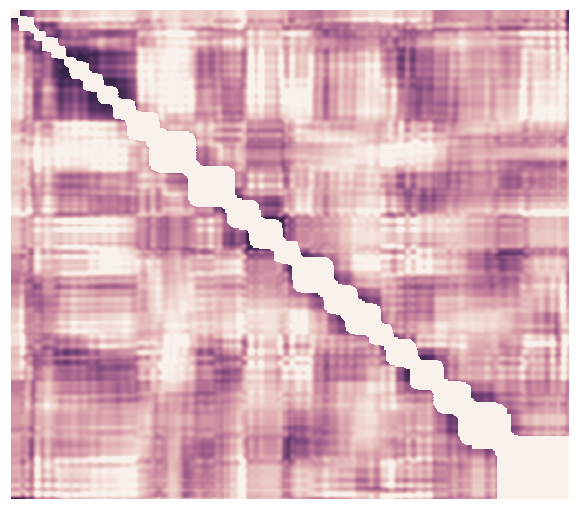

11


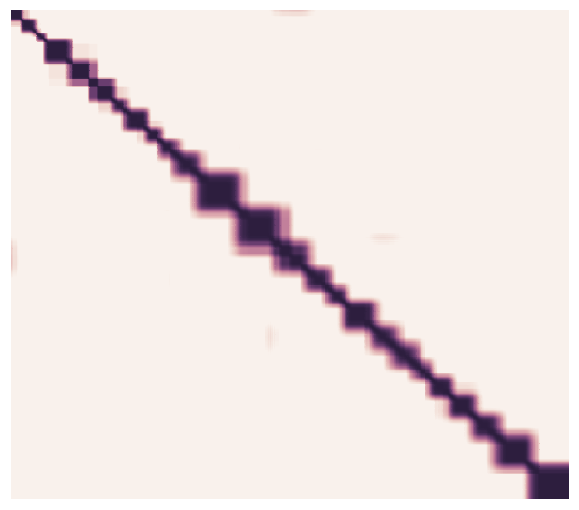

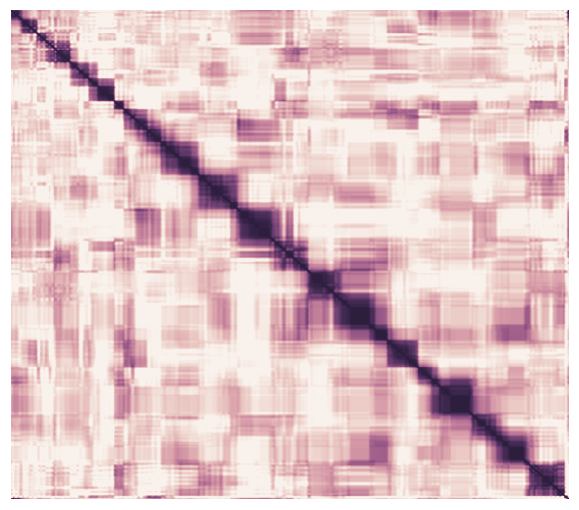

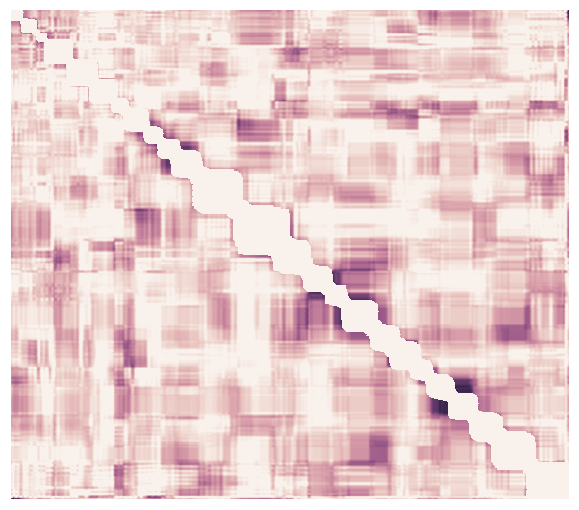

12


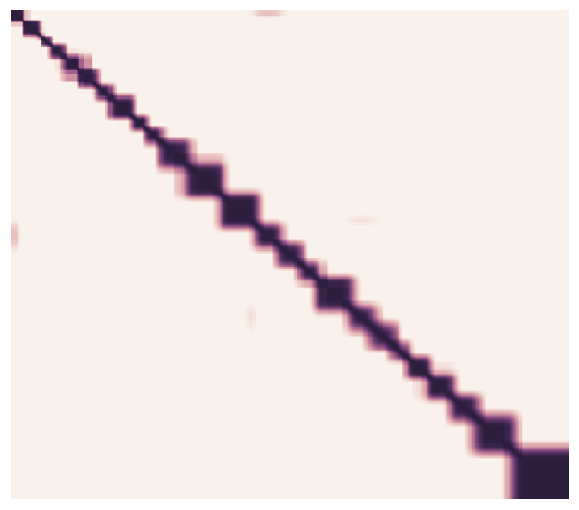

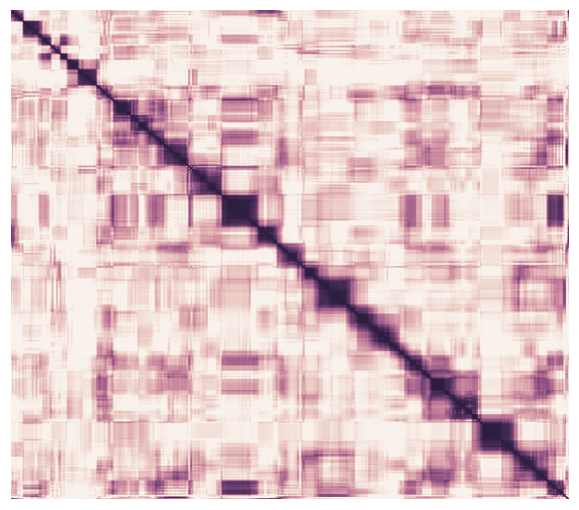

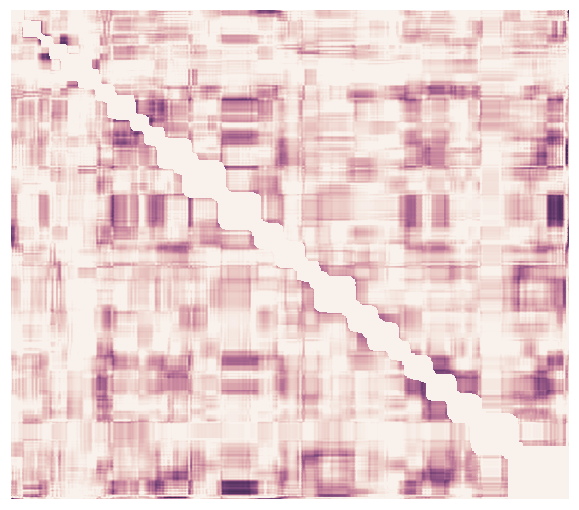

13


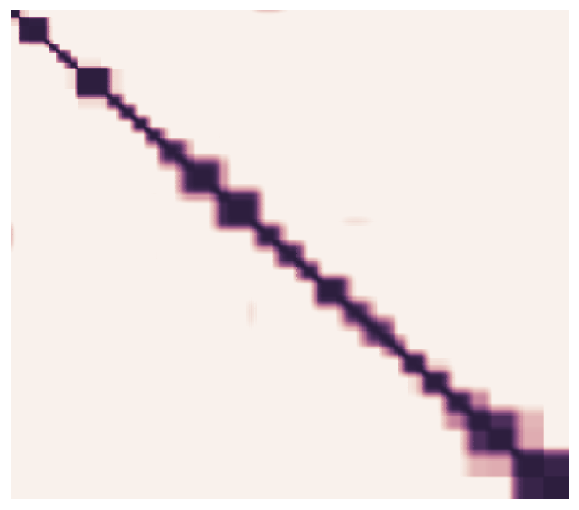

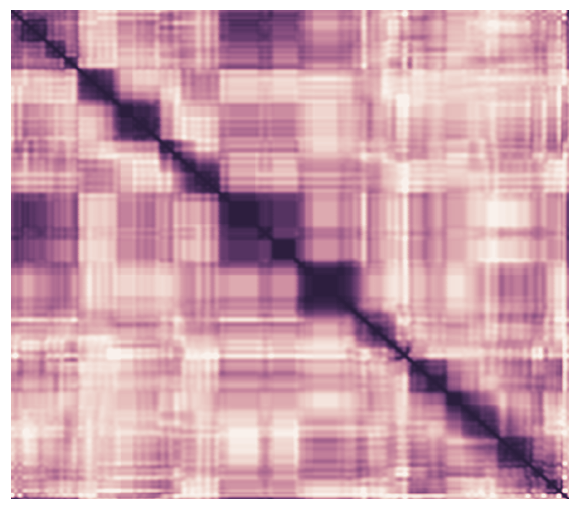

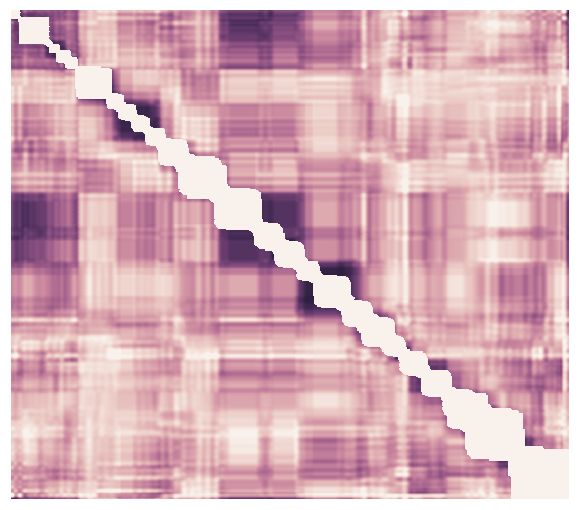

14


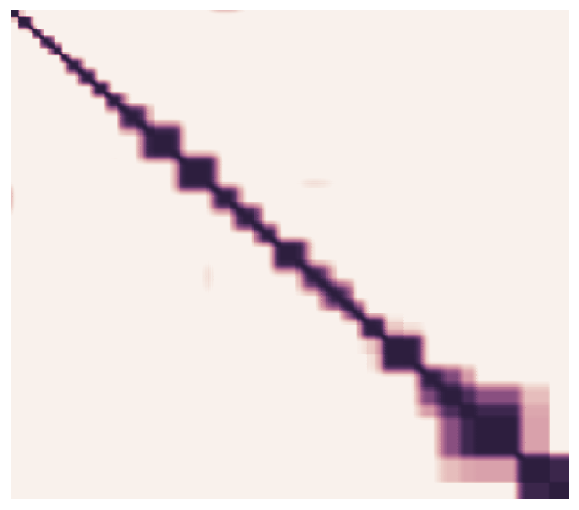

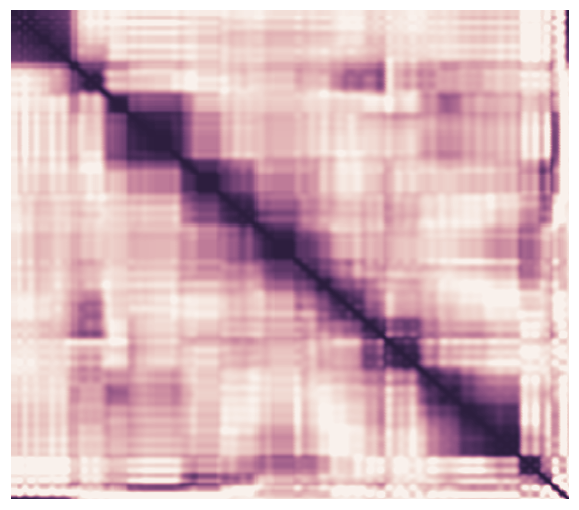

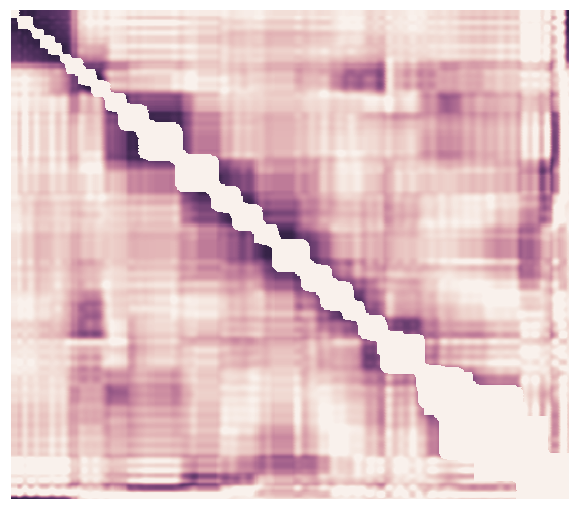

15


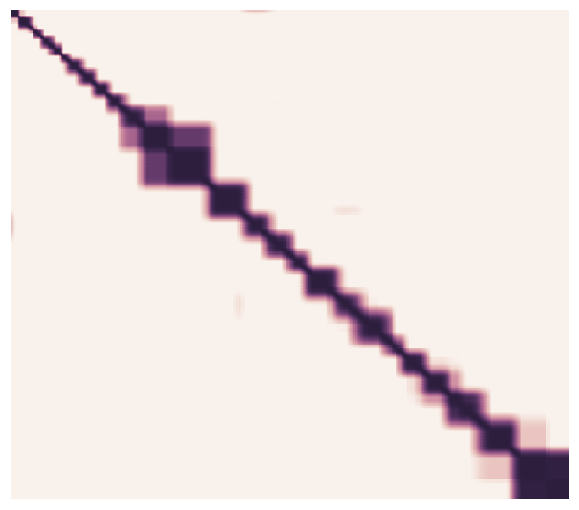

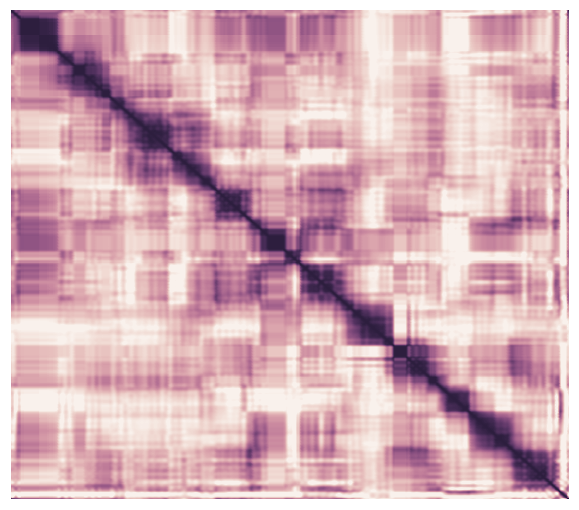

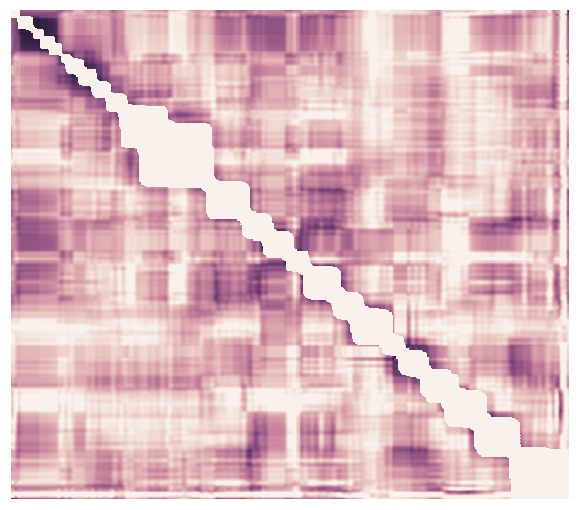

16


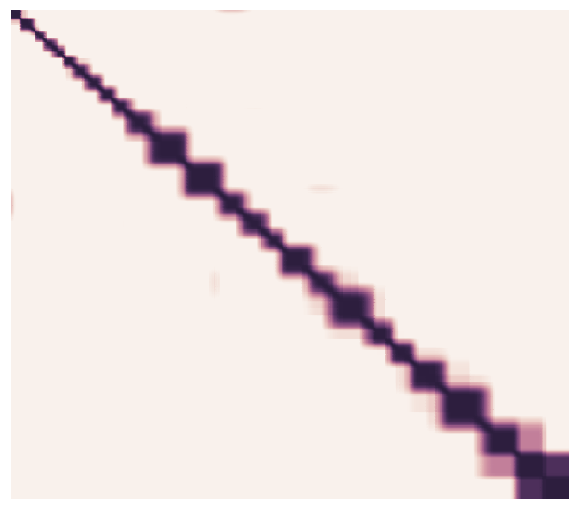

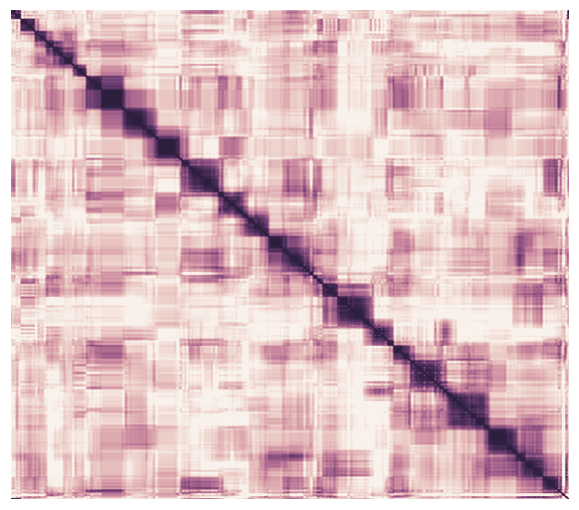

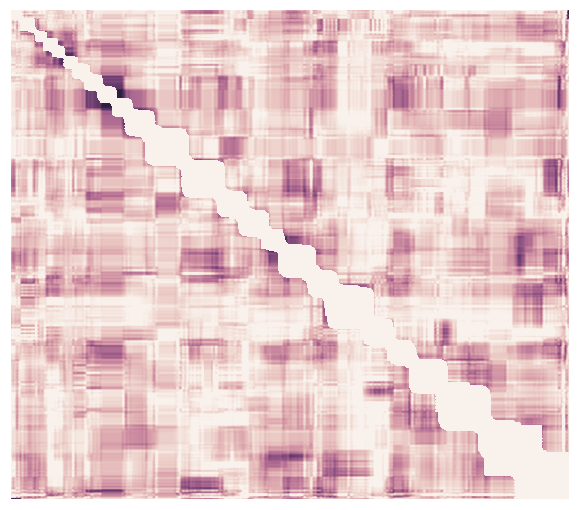

In [20]:
for i in range(17):
    print(i)
    m = pd.DataFrame(movie_models_dtw[i]).T.corr()
    sns.heatmap(m, vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
    plt.show()
    r = pd.DataFrame(recall_models_rs_dtw[i]).T.corr()
    sns.heatmap(r, vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
    plt.show()
    b = r.copy()
    b[m>.3]=0
    sns.heatmap(b, vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
    # d = pd.DataFrame(recall_models_rs_dtw[i]).T.corr().values
    # np.save('../data/s%s_recall_corrmat_dtw.npy' % str(i+1), d)
    plt.show()

In [4]:
import hypertools as hyp
import numpy as np
%matplotlib inline
# for sub in range(17):
#     labels = hyp.cluster(movie_models_dtw[sub], cluster='HDBSCAN')
#     events = [np.atleast_2d(np.mean(movie_models_dtw[sub][labels==l,:], 0)) for l in np.unique(labels)]
#     hyp.plot([recall_models_rs_dtw[sub]]+events, ['-']+['o']*len(events), palette='Greens_d', size=[10, 8])


## Plot warped and unwarped correlations by subject

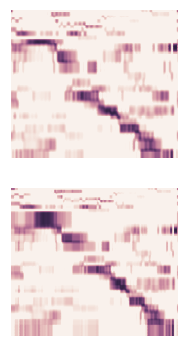

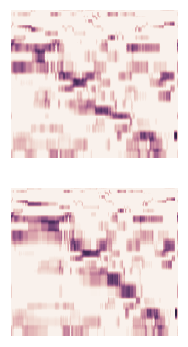

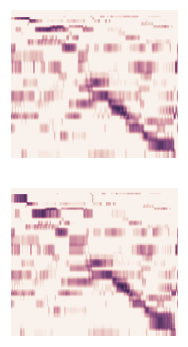

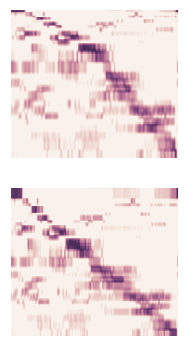

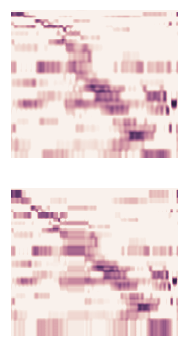

...

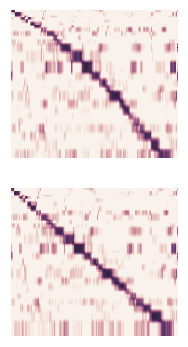

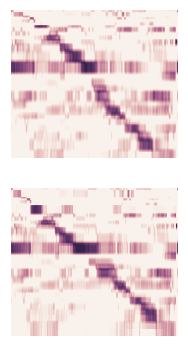

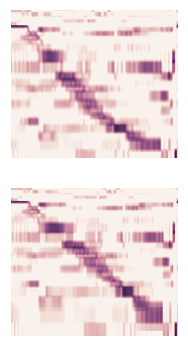

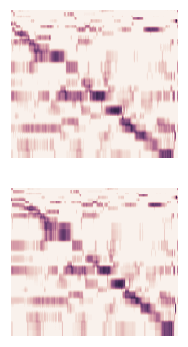

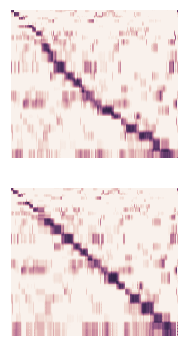

In [118]:
plt.rc('figure', figsize=(3, 6))
for i, (a, b) in enumerate(zip(cms, cms_aligned)):
    f, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
#     print('Subject: %d' % i)
#     ax1.set_title('Unwarped')
#     ax2.set_title('Warped')
    sns.heatmap(a, vmin=0, vmax=1, yticklabels=False, xticklabels=False, 
                cmap=sns.cubehelix_palette(light=.95, as_cmap=True), ax=ax1, cbar=False)
    sns.heatmap(b, vmin=0, vmax=1, yticklabels=False, xticklabels=False, 
                cmap=sns.cubehelix_palette(light=.95, as_cmap=True), ax=ax2, cbar=False)
#     f.savefig('../figures/sub%s_movie_rec_corrmat.png' % str(i))
    plt.show()

## Pull out an example subject and plot

In [119]:
distance, path = fastdtw(movie_model, recall_models_rs[12], dist=correlation)
a = 1 - cdist(movie_model, recall_models_rs[12], 'correlation')
m = movie_model[list(map(lambda x: x[0], path)), :]
r = recall_models_rs[12][list(map(lambda x: x[1], path)), :]
c = 1 - cdist(m, r, 'correlation')

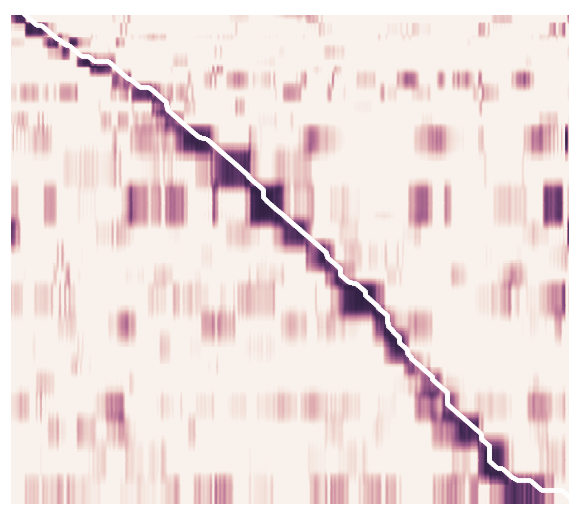

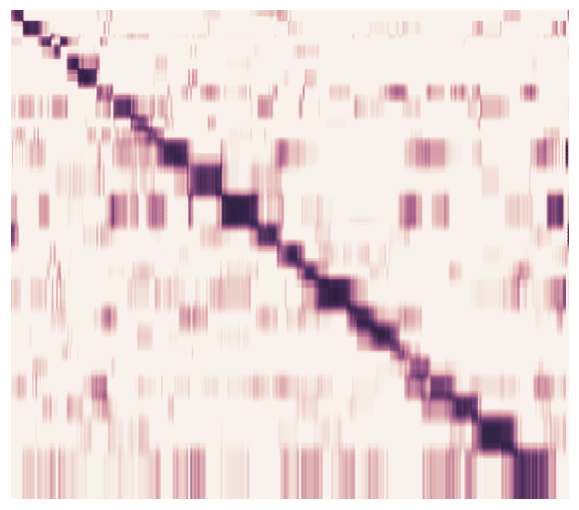

In [120]:
plt.rc('figure', figsize=(10, 9))
ax = sns.heatmap(a, vmin=0, vmax=1, yticklabels=False, 
                 xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
for p in path:
    ax.text(p[1], p[0], '*', color='white'); 
# ax.figure.savefig('../figures/dtw_example_after.png')
plt.show()
ax2 = sns.heatmap(c, vmin=0, vmax=1, yticklabels=False, xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True), cbar=False)
# ax2.figure.savefig('../figures/dtw_example_before.png')
plt.show()

## Plot aligned movie model

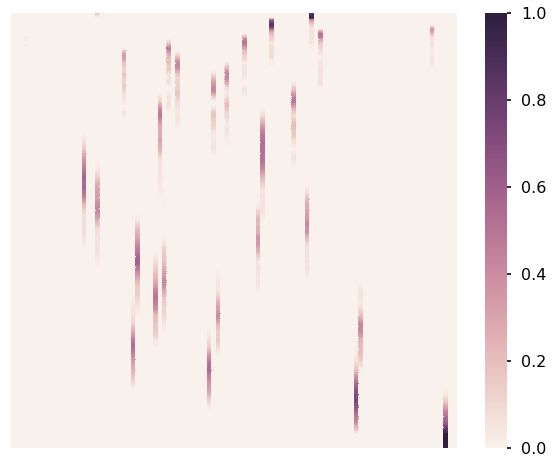

In [121]:
plt.rc('figure', figsize=(10, 8))
m = [resize(c, (1976, 100)) for c in movie_models_dtw]
ax = sns.heatmap(np.mean(m, 0), vmin=0, vmax=1, yticklabels=False, 
                 xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True))
# ax.figure.savefig('../figures/movie_model_dtw.png')

## Plot aligned recall model

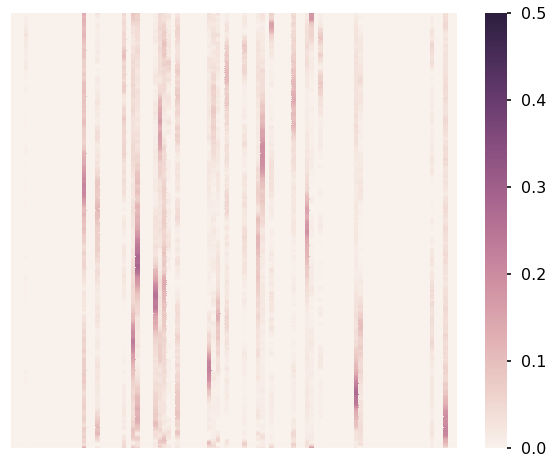

In [122]:
r = [resize(c, (1976, 100)) for c in recall_models_rs_dtw]
ax = sns.heatmap(np.mean(r, 0), vmin=0, vmax=.5, yticklabels=False, 
                 xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True))
# ax.figure.savefig('../figures/recall_model_dtw.png')

## Plot aligned movie-recall correlation matrix

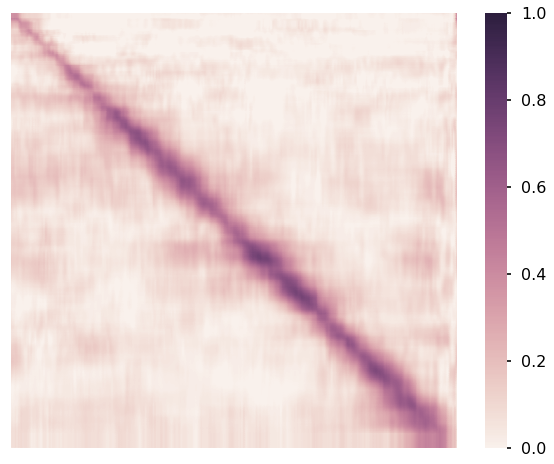

In [123]:
cms_aligned_resized = [resize(c, (1976, 1976)) for c in cms_aligned]
ax = sns.heatmap(np.mean(cms_aligned_resized, 0), vmin=0, vmax=1, yticklabels=False, 
                 xticklabels=False, cmap=sns.cubehelix_palette(light=.95, as_cmap=True))
# ax.figure.savefig('../figures/movie_recall_correlation_dtw.png')

## Plot models with hypertools

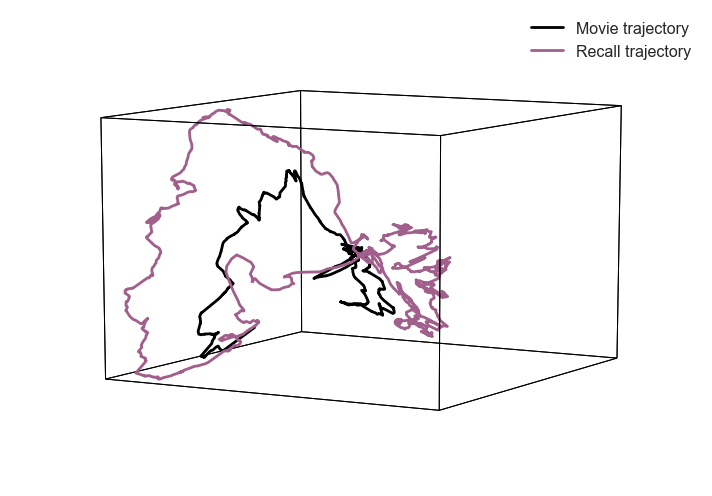

In [67]:
import hypertools as hyp
%matplotlib inline

plt.rc('figure', figsize=(10, 7))
recall = np.mean(recall_models_rs, axis=0)
hyp.plot([movie_model, recall], 
         color=['k', sns.cubehelix_palette(light=.95)[3]], linestyle=['-', '-'],  
         reduce='SpectralEmbedding', legend=['Movie trajectory', 'Recall trajectory'], 
         save_path='../figures/movie_recall_correlation_hyp.pdf')

# plt.rc('figure', figsize=(10, 7))
# hyp.plot([np.mean(m, 0), np.mean(r, 0)], 
#          color=['k', sns.cubehelix_palette(light=.95)[3]], linestyle=['-', '-'],  
#          reduce='SpectralEmbedding', legend=['Movie trajectory', 'Recall trajectory'], 
#          save_path='../figures/movie_recall_correlation_hyp_dtw.pdf')
# plt.rc('figure', figsize=(10, 7))
# hyp.plot([np.mean(movie_model, 0), np.mean(r, 0)], 
#          color=['k', sns.cubehelix_palette(light=.95)[3]], linestyle=['-', '-'],  
#          reduce='SpectralEmbedding', legend=['Movie trajectory', 'Recall trajectory'])

## Plot the diagonals

(0, 1926)

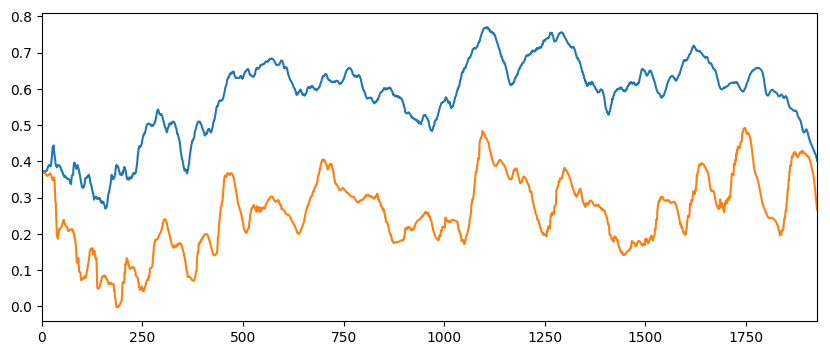

In [133]:
sns.reset_defaults()
plt.rc('figure', figsize=(10, 4))
plt.plot(np.diag(np.mean(cms_aligned_resized, 0)))
plt.plot(np.diag(np.mean(cms, 0)))
plt.xlim(0, 1976-50)

In [48]:
dists_aligned = [np.diag(r)[:1976-50] for r in cms_aligned_resized]
for i in range(17):
    np.savetxt('../evs/s%s_corrdist_dtw.txt' % str(i+1), dists_aligned[i] - np.mean(dists_aligned[i]))

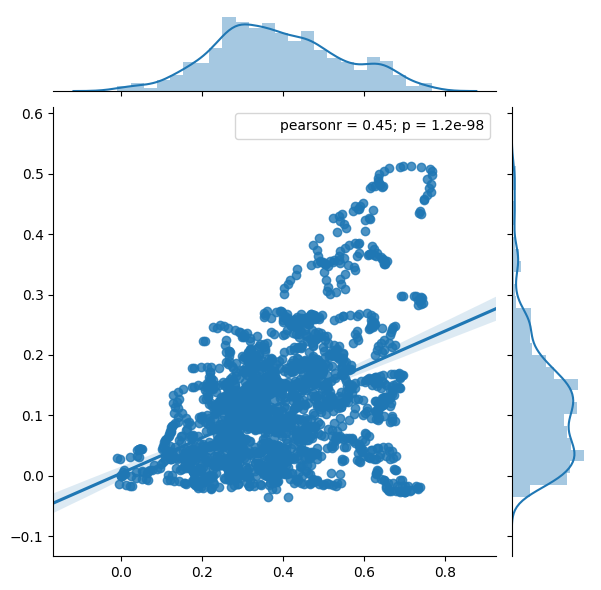

In [109]:
sns.jointplot(np.diag(np.mean(cms_aligned_resized, 0)), np.diag(np.mean(cms, 0)), kind='reg')

In [60]:
dists = [np.diag(1 - cdist(movie_topics, r, 'correlation')) for r in recall_topics_rs_all]
avg_dist = zscore(_z2r(np.mean([_r2z(d) for d in dists], 0))[:1976-50])

In [64]:
np.savetxt('../evs/corrdist_avg_zscore.txt', avg_dist)

In [65]:
for i in range(17):
    np.savetxt('../analysis/s%s_corrdist.txt' % str(i+1), dists[i] - np.mean(dists[i]))

In [48]:
sns.reset_defaults()
matplotlib.rc('figure', figsize=(10, 4))
ax = sns.tsplot(dists)
ax.set_ylabel('Average Movie/Recall Correlation')
ax.set_xlabel('Timepoint (TR)')
ax.set_xlim(0, 1976-50)
# ax.figure.savefig('/Users/andyheusser/Documents/cdl/projects/sherlock/figures/avg_movie_recall_corr.pdf')

NameError: name 'dists' is not defined

In [260]:
t1 = np.argmax(np.mean(dists,0)[:50])
timepoint1 = np.argsort(movie_topics[t1])[::-1][0]

t2 = np.argmin(np.mean(dists,0)[:500])
timepoint2 = np.argsort(movie_topics[t2])[::-1][0]

t3 = np.argmax(np.mean(dists,0)[:1500])
timepoint3 = np.argsort(movie_topics[t3])[::-1][0]

timepoints = [timepoint1, timepoint2, timepoint3]

In [226]:
def print_top_words(model, feature_names, n_top_words, topics):
    for topic_idx, topic in enumerate(model.components_[topics,:]):
        message = "Topic #%d: " % topic_idx
        message = " ".join([feature_names[i]
                             for i in topic.argsort()[:-n_top_words - 1:-1]])
        print(message)

In [229]:
tf_feature_names = tf_vectorizer.get_feature_names()
print_top_words(lda, tf_feature_names, 5, timepoints)

john psychotherapist indoor medium room
sherlock john hospital st bartholomew
john yes road outdoor phone


In [234]:
ranges =[[d['Start Time (TRs, 1.5s)'],d['End Time (TRs, 1.5s)']] for i, d in data.iterrows()] 
expanded_movie5 = []
for i in range(1976):
    try:
        idx = np.where([i>=r[0] and i<=r[1] for r in ranges])[0][0]
        expanded_movie5.append(movie5[idx])
    except:
        expanded_movie5.append(movie5[0])

In [242]:
# expanded_movie5[t3]

In [248]:
sub=1
recall = pd.read_csv('../data/NN'+str(sub)+' transcript.txt', header=None, sep='.', error_bad_lines=False).values.tolist()[0][:-1]
rec = lda.transform(tf_vectorizer.transform([unicode(r, errors='ignore') for r in recall]))

In [254]:
1 - cdist(movie_topics[t2].reshape(1,-1), rec)

array([[ 0.00857995, -0.10070973,  0.10500933,  0.07680918,  0.07623566,
         0.25034687,  0.14245465,  0.07742359,  0.09475493,  0.17495566,
         0.21568643,  0.09475493,  0.37186899,  0.68145169,  0.05577443,
         0.75951086, -0.06481831,  0.15871476,  0.11005995,  0.63068334,
         0.17836475,  0.01432159,  0.10945185,  0.12560073,  0.09475495,
        -0.10070973,  0.25034687, -0.00097842,  0.01382089,  0.05987339,
         0.73859683,  0.12364072,  0.09475493,  0.06077798,  0.10047792,
         0.06392371,  0.06738892, -0.00762009,  0.02329536,  0.02444745,
         0.09475493, -0.06481831, -0.10070973,  0.06454613,  0.09475493,
        -0.00762009, -0.02225867,  0.03550486,  0.24667681,  0.0277401 ,
         0.0740653 ,  0.09640715,  0.10875238,  0.03523272, -0.00762009,
         0.04777404, -0.12522346, -0.12522346,  0.10945185, -0.14300063,
         0.66324593,  0.16570391,  0.05575672,  0.04356657,  0.09508754,
         0.08489662,  0.06520641,  0.0445647 ,  0.0

In [365]:
m = lda.transform(tf_vectorizer.transform([expanded_movie5[t] for t in [t1, t2, t3]]))[:,[timepoint1, timepoint2, timepoint3]]
r = lda.transform(tf_vectorizer.transform([unicode(r, errors='ignore') for r in [recall[2], recall[12], recall[51]]]))[:,[timepoint1, timepoint2, timepoint3]]

In [382]:
df1 = pd.DataFrame(m.ravel(), columns=['Topic weights'])
df1['timepoint']=['t1']*3+['t2']*3+['t3']*3
df1['Topic']=['t1', 't2', 't3']*3
df1['condition']='movie'

df2 = pd.DataFrame(r.ravel(), columns=['Topic weights'])
df2['timepoint']=['t1']*3+['t2']*3+['t3']*3
df2['Topic']=['t1', 't2', 't3']*3
df2['condition']='recall'

df = pd.concat([df1, df2])

In [383]:
df[df['timepoint']==1]

,Topic weights,timepoint,Topic,condition


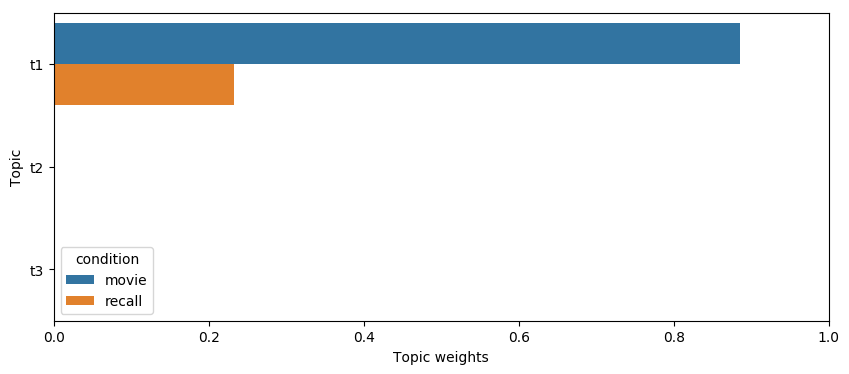

In [388]:
ax = sns.barplot(y='Topic', x='Topic weights', hue='condition', data=df[df['timepoint']=='t1'])
ax.set_xlim([0,1])
ax.figure.savefig('/Users/andyheusser/Documents/cdl/projects/sherlock/figures/t1.pdf')

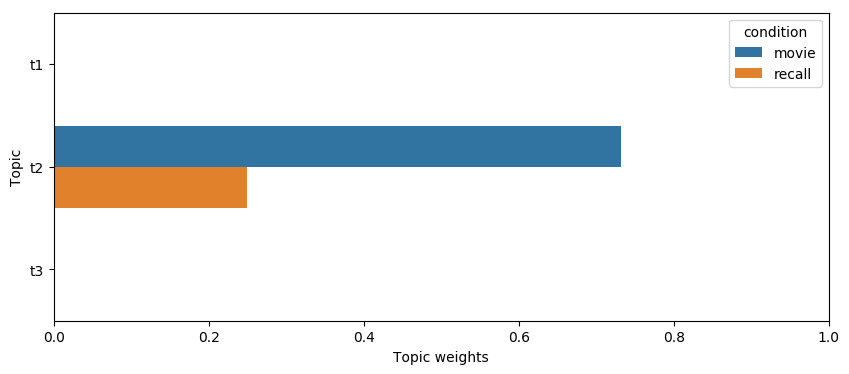

In [389]:
ax = sns.barplot(y='Topic', x='Topic weights', hue='condition', data=df[df['timepoint']=='t2'])
ax.set_xlim([0,1])
ax.figure.savefig('/Users/andyheusser/Documents/cdl/projects/sherlock/figures/t2.pdf')

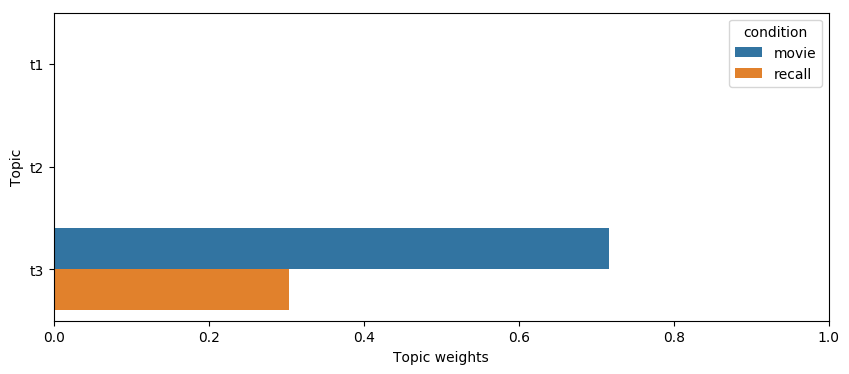

In [390]:
ax = sns.barplot(y='Topic', x='Topic weights', hue='condition', data=df[df['timepoint']=='t3'])
ax.set_xlim([0,1])
ax.figure.savefig('/Users/andyheusser/Documents/cdl/projects/sherlock/figures/t3.pdf')

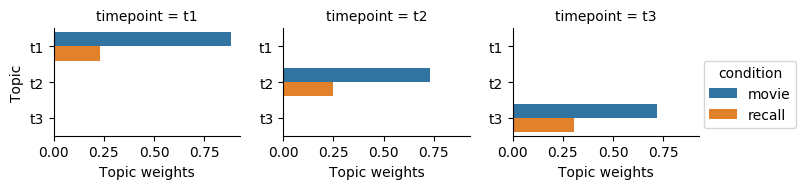

In [422]:
g = sns.factorplot(x="Topic weights", y="Topic",
hue="condition", col="timepoint",
data=df, kind="bar", size=2, aspect=1.2);
g.savefig('/Users/andyheusser/Documents/cdl/projects/sherlock/figures/fig1_topicweights.pdf')

/Users/andyheusser/Library/Enthought/Canopy_64bit/User/lib/python2.7/site-packages/matplotlib/axes/_axes.py:6448: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


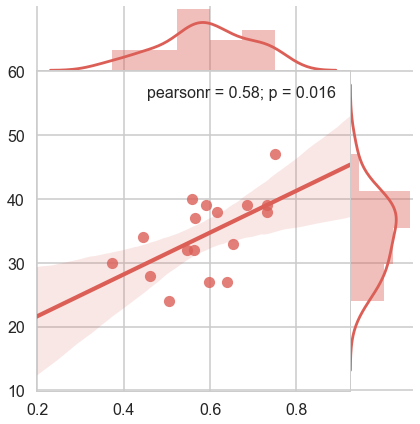

In [17]:
model_rec = [np.diag(c).mean() for c in cms_aligned]
hand_rec = [27, 24, 32, 33, 32, 39, 30, 39, 28, 40, 34, 38, 47, 38, 27, 37, 39]
out_of_order = [1, 4, 2, 8, 0, 4, 14, 5, 5, 3, 6, 3, 13, 10, 3, 11, 9]
sns.jointplot(np.array(model_rec), np.array(hand_rec), kind='reg', space=False)

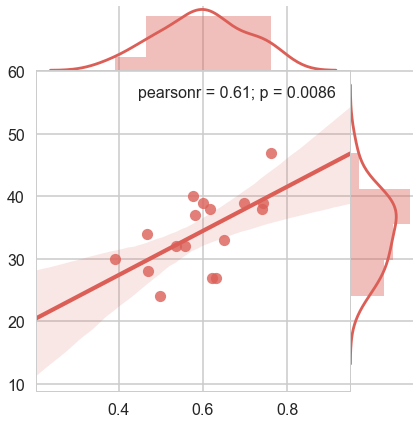

In [18]:
from scipy.stats import pearsonr
movie_rec_corr = [pearsonr(m.ravel(),r.ravel())[0] for m, r in zip(movie_models_dtw, recall_models_rs_dtw)]
sns.jointplot(np.array(movie_rec_corr), np.array(hand_rec), kind='reg', space=False)